libraries

In [35]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import re
import gc
import pickle
import json


os.makedirs('/kaggle/working/models', exist_ok=True)
os.makedirs('/kaggle/working/results', exist_ok=True)
os.makedirs('/kaggle/working/checkpoints', exist_ok=True)


progress_file = '/kaggle/working/progress.json'
if os.path.exists(progress_file):
    with open(progress_file, 'r') as f:
        progress = json.load(f)
else:
    progress = {'completed': []}



Libraries imported successfully


data loading and preprocessing

In [37]:
train_df = pd.read_csv("/kaggle/input/sports-image-classification/dataset/train.csv")
test_df = pd.read_csv("/kaggle/input/sports-image-classification/dataset/test.csv")
IMG_SIZE = 64 
TRAIN_DIR = "/kaggle/input/sports-image-classification/dataset/train"
TEST_DIR = "/kaggle/input/sports-image-classification/dataset/test"


print(f"Total train samples: {len(train_df)}")
print(f"Total test samples: {len(test_df)}")
print(f"Classes: {train_df['label'].unique()}")


Total train samples: 8227
Total test samples: 2056
Classes: ['Badminton' 'Cricket' 'Tennis' 'Swimming' 'Soccer' 'Wrestling' 'Karate']


In [38]:
train_df.head()

,image_ID,label
0,7c225f7b61.jpg,Badminton
1,b31.jpg,Badminton
2,acb146546c.jpg,Badminton
3,0e62f4d8f2.jpg,Badminton
4,cfd2c28c74.jpg,Cricket


In [39]:
test_df.head()

,image_ID
0,f5e13966e7.jpg
1,6674191b4e.jpg
2,91b5f8b7a9.jpg
3,393119b6d6.jpg
4,1ce5f81578.jpg


In [40]:
train_df.isnull().sum()


image_ID    0
label       0
dtype: int64

as we can see we don't have missing values


In [41]:
train_df.duplicated().sum()

0

also , we don't have duplicates

load images

In [42]:
def load_images(df, directory, img_size=IMG_SIZE):
  
    images = []
    labels = []
    
    for _, row in df.iterrows():
        try:
            # Load and resize image
            img_path = os.path.join(directory, row['image_ID'])
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, (img_size, img_size))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
                images.append(img)
                labels.append(row['label'])
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
    
    return np.array(images), np.array(labels)

print("\nLoading training images...")
X_train, y_train = load_images(train_df, TRAIN_DIR)
print(f"Loaded {len(X_train)} images")


Loading training images...
Loaded 8227 images


distrubtion of each class according to number of images


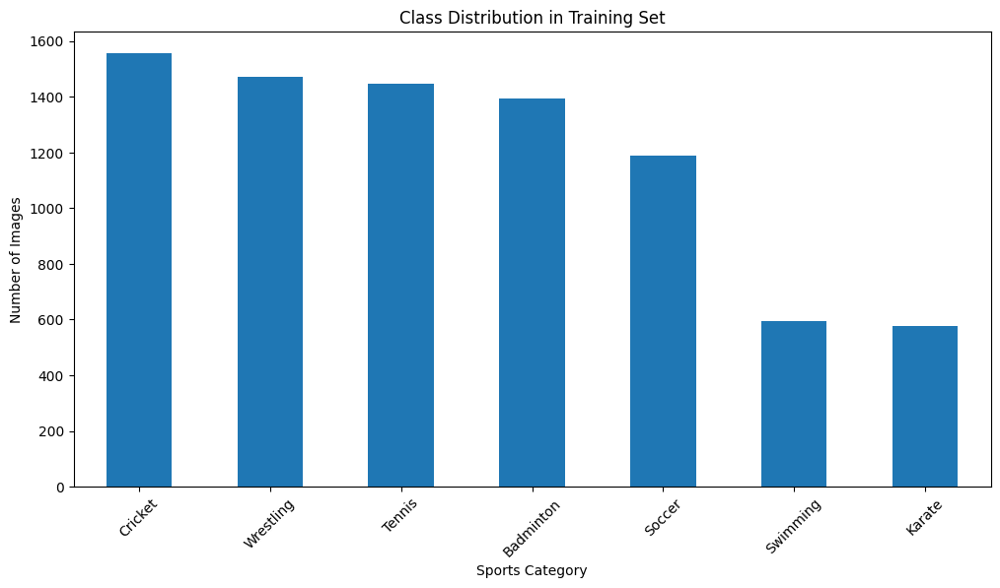

Class distribution:
label
Cricket      1556
Wrestling    1471
Tennis       1445
Badminton    1394
Soccer       1188
Swimming      595
Karate        578
Name: count, dtype: int64


In [44]:

class_dist = train_df['label'].value_counts()
plt.figure(figsize=(12, 6))
class_dist.plot(kind='bar')
plt.title("Class Distribution in Training Set")
plt.xlabel("Sports Category")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.show()
print("Class distribution:")
print(class_dist)

as we can see we have imbalance in data , (karate , swimming ) have few images according to others

samples of image grid

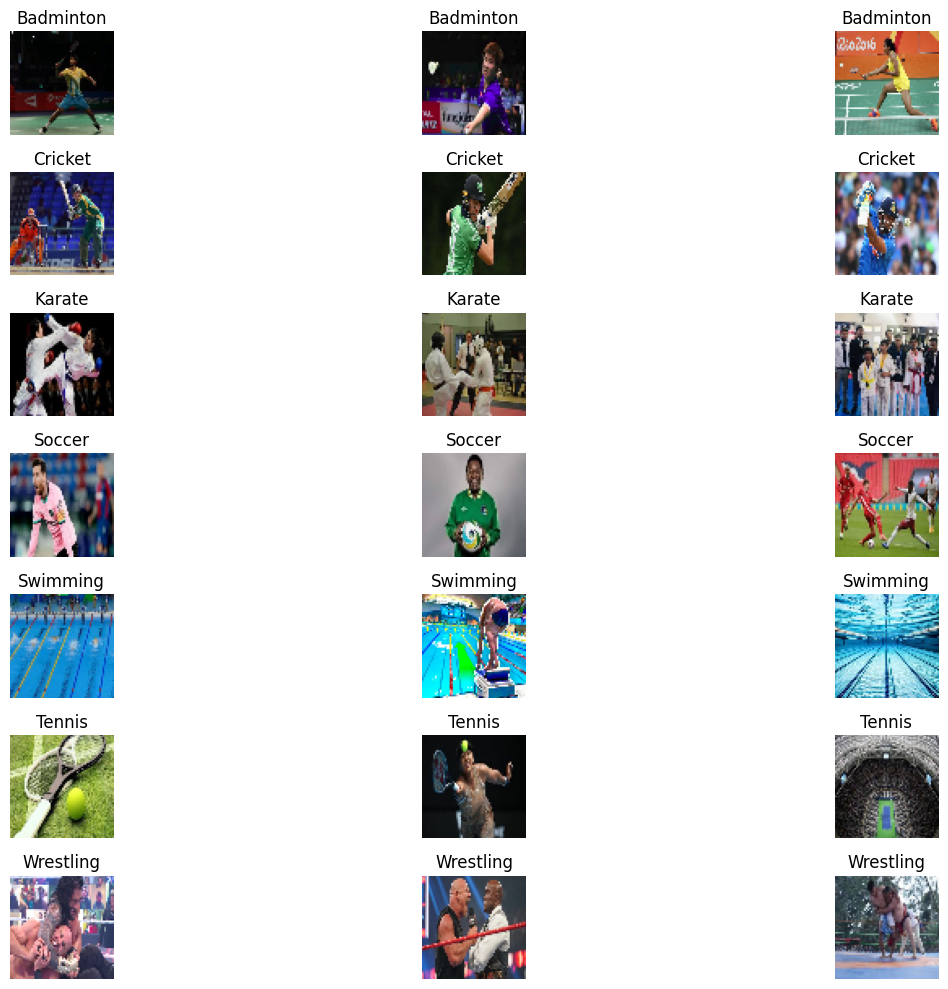

In [45]:
plt.figure(figsize=(15, 10))
unique_labels = np.unique(y_train)

for i, label in enumerate(unique_labels):
    indices = np.where(y_train == label)[0]
    for j in range(min(3, len(indices))):
        plt.subplot(len(unique_labels), 3, i*3 + j + 1)
        plt.imshow(X_train[indices[j]])
        plt.title(label)
        plt.axis('off')

plt.tight_layout()
plt.show()

 correlation analysis  for RGB channels

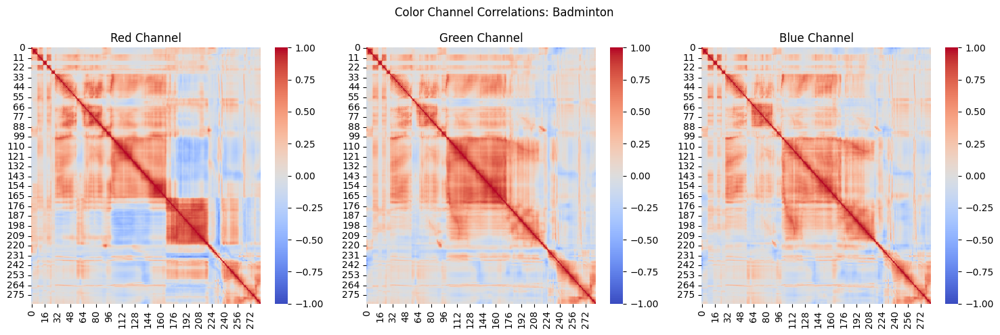

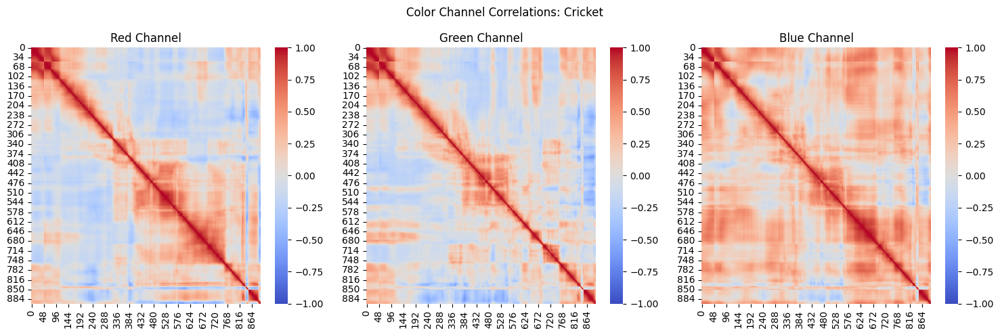

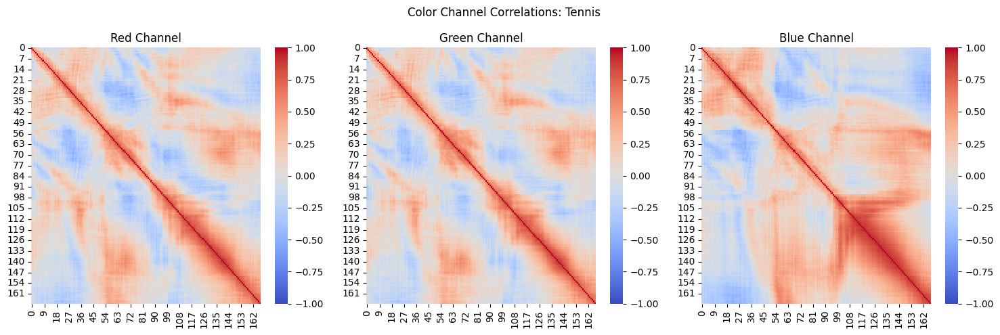

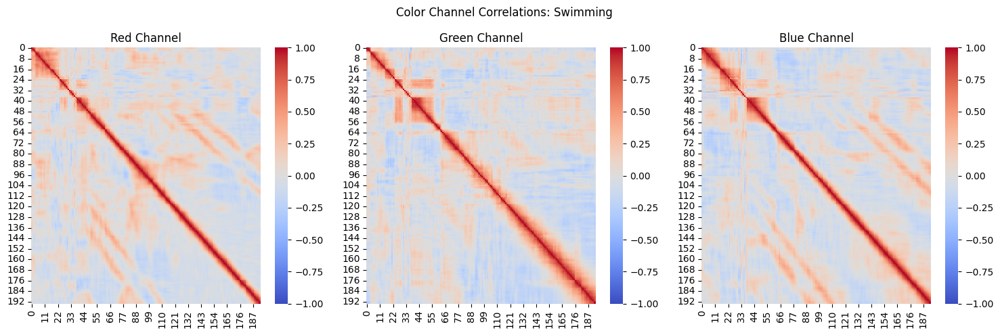

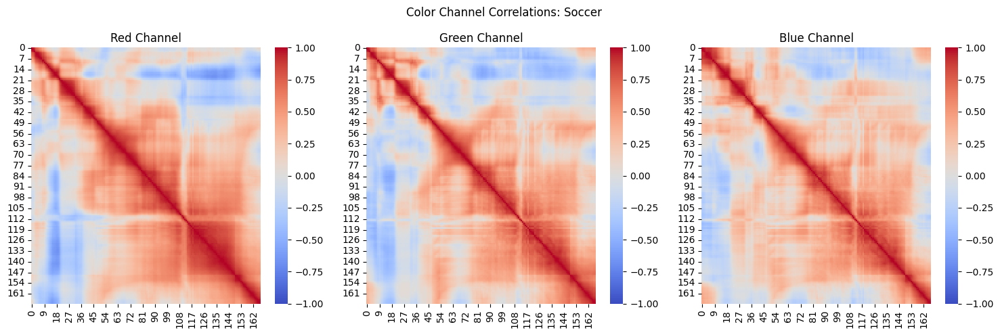

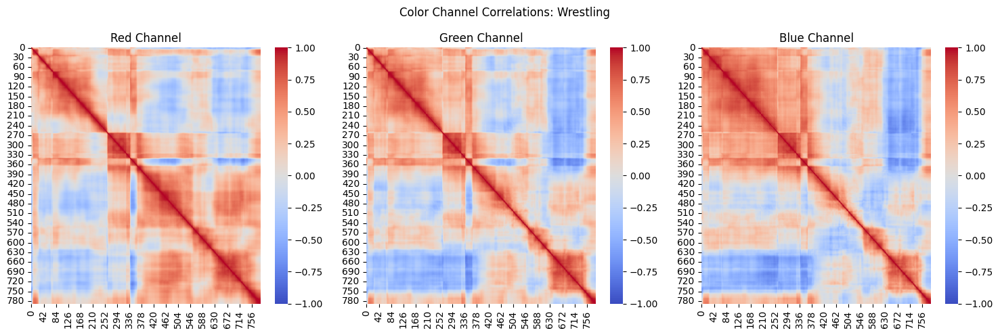

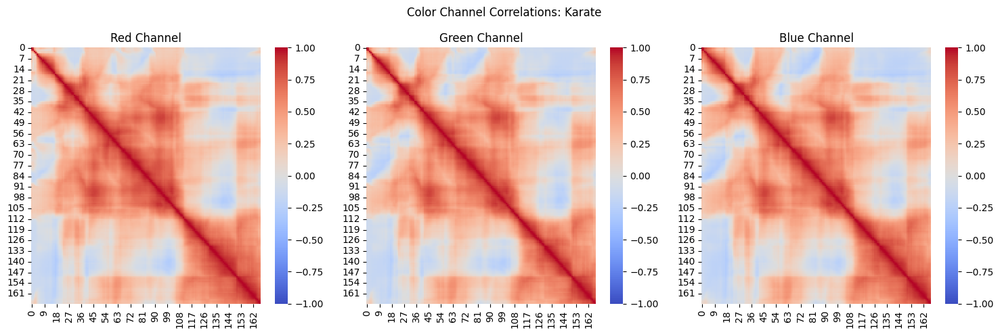

In [47]:
for sport_class in train_df['label'].unique():
    # Get first image for this class
    sample_img_path = train_df[train_df['label'] == sport_class]['image_ID'].iloc[0]
    full_path = os.path.join(TRAIN_DIR, sample_img_path)
    
    # Load image using cv2 instead of PIL
    img = cv2.imread(full_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    img = img / 255.0  # Normalize to [0,1]
    
    # Create figure for correlation heatmaps
    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Color Channel Correlations: {sport_class}')
    
    # Red channel correlation
    plt.subplot(1, 3, 1)
    sns.heatmap(np.corrcoef(img[:,:,0].reshape(-1, img.shape[1])),
                cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Red Channel')
    
    # Green channel correlation
    plt.subplot(1, 3, 2)
    sns.heatmap(np.corrcoef(img[:,:,1].reshape(-1, img.shape[1])),
                cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Green Channel')
    
    # Blue channel correlation
    plt.subplot(1, 3, 3)
    sns.heatmap(np.corrcoef(img[:,:,2].reshape(-1, img.shape[1])),
                cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Blue Channel')
    
    plt.tight_layout()
    plt.show()

label encoder for label column in the training dataset

In [50]:
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
class_names = label_encoder.classes_
print("Classes with encodings:", dict(zip(class_names, range(len(class_names)))))

Classes with encodings: {'Badminton': 0, 'Cricket': 1, 'Karate': 2, 'Soccer': 3, 'Swimming': 4, 'Tennis': 5, 'Wrestling': 6}


split the training data to train and validation data set

data augmentation 

In [51]:

def augment_images(images, labels, augmentation_factor=2):
   
    import cv2
    import numpy as np
    
    print(f"Starting augmentation with factor {augmentation_factor}...")
    print(f"Original data shape: {images.shape}")
    
    aug_images = []
    aug_labels = []
    
    # Add original images
    aug_images.extend(images)
    aug_labels.extend(labels)
    
    # Create augmented versions
    for i in range(len(images)):
        img = images[i].copy()
        lbl = labels[i]
        
        
        for j in range(augmentation_factor-1):
            # Start with a copy of the original
            aug_img = img.copy()
            
            # Apply horizontal flip (50% chance)
            if np.random.rand() > 0.5:
                aug_img = cv2.flip(aug_img, 1)
            
            # Apply slight rotation (50% chance)
            if np.random.rand() > 0.5:
                angle = np.random.uniform(-15, 15)
                h, w = aug_img.shape[:2]
                M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
                aug_img = cv2.warpAffine(aug_img, M, (w, h))
            
            # Apply brightness change (50% chance)
            if np.random.rand() > 0.5:
                brightness = np.random.uniform(0.8, 1.2)
                aug_img = np.clip(aug_img * brightness, 0, 255).astype(np.uint8)
            
            # Add the augmented image and its label
            aug_images.append(aug_img)
            aug_labels.append(lbl)
    
    # convert  to numpy arrays
    aug_images = np.array(aug_images)
    aug_labels = np.array(aug_labels)
    
    print(f"Augmented data shape: {aug_images.shape}")
    return aug_images, aug_labels
    

In [52]:

# Apply augmentation before train/val split
X_train_augmented, y_train_encoded_augmented = augment_images(X_train, y_train_encoded, augmentation_factor=3)

#  class distribution after augmentation
unique, counts = np.unique(y_train_encoded_augmented, return_counts=True)
class_counts = dict(zip(unique, counts))
print("Class distribution after augmentation:")
for class_idx, count in class_counts.items():
    print(f"  Class {label_encoder.classes_[class_idx]}: {count} images")


X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(
    X_train_augmented, y_train_encoded_augmented, 
    test_size=0.2, 
    random_state=42,
    stratify=y_train_encoded_augmented
)

print(f"Training set: {len(X_train_split)} images")
print(f"Validation set: {len(X_val_split)} images")

Starting augmentation with factor 3...
Original data shape: (8227, 64, 64, 3)
Augmented data shape: (24681, 64, 64, 3)
Class distribution after augmentation:
  Class Badminton: 4182 images
  Class Cricket: 4668 images
  Class Karate: 1734 images
  Class Soccer: 3564 images
  Class Swimming: 1785 images
  Class Tennis: 4335 images
  Class Wrestling: 4413 images
Training set: 19744 images
Validation set: 4937 images


standraiztion 

In [53]:

train_mean = np.mean(X_train_split, axis=(0, 1, 2))
train_std = np.std(X_train_split, axis=(0, 1, 2))
print(f"Training mean: {train_mean}")
print(f"Training std: {train_std}")


X_train_std = (X_train_split - train_mean) / train_std
X_val_std = (X_val_split - train_mean) / train_std


X_train_norm = X_train_split / 255.0
X_val_norm = X_val_split / 255.0


print("\nStandardized training set:")
print(f"Mean: {np.mean(X_train_std, axis=(0,1,2))}")
print(f"Std: {np.std(X_train_std, axis=(0,1,2))}")

print("\nNormalized training set:")
print(f"Mean: {np.mean(X_train_norm, axis=(0,1,2))}")
print(f"Std: {np.std(X_train_norm, axis=(0,1,2))}")

Training mean: [104.34371533 104.67588477 100.76444183]
Training std: [73.60696558 71.42281938 72.11797188]

Standardized training set:
Mean: [ 5.54255147e-14 -5.88024938e-14  5.20998127e-14]
Std: [1. 1. 1.]

Normalized training set:
Mean: [0.40919104 0.41049367 0.39515467]
Std: [0.28865477 0.28008949 0.28281558]


part 2 : train the cnn model

first we create functions to save checkpoints of each explore result 

In [ ]:
FORCE_RETRAIN = False
def is_completed(step_name):

    if FORCE_RETRAIN:
        return False  
    else:
        return step_name in progress.get('completed', [])

def save_checkpoint(model, history, name):
   
    model_path = f'/kaggle/working/models/{name}_model.keras'
    history_path = f'/kaggle/working/results/{name}_history.pkl'

    model.save(model_path)

    with open(history_path, 'wb') as f:
        pickle.dump(history.history, f)

    if name not in progress['completed']:
        progress['completed'].append(name)
        with open('/kaggle/working/progress.json', 'w') as f:
            json.dump(progress, f)

    print(f"✓ Saved checkpoint: {name}")

def clear_memory():
    import gc
    import tensorflow as tf
    
   
    tf.keras.backend.clear_session()
    

    gc.collect()
    
    print("Memory cleared")

In [69]:
def build_model(num_classes, num_layers=3, dropout_rate=0.5):
  

    IMG_SIZE = 64  #faster train
    
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    
    if num_layers >= 2:
        model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.MaxPooling2D((2, 2)))

    if num_layers >= 3:
        model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.MaxPooling2D((2, 2)))

    if num_layers >= 4:
        model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.GlobalAveragePooling2D())  
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

3- function for plotting the training process history

In [70]:
def plot_history(history, title='Training Process'):
    
    plt.figure(figsize=(12, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Validation')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

2- function of the model training

In [71]:
def train_model(X_train, y_train, X_val, y_val,
                batch_size=32,
                num_layers=3,
                dropout_rate=0.5,
                optimizer_name='adam',
                learning_rate=0.001,
                weight_decay=0.0001,
                use_scheduler=True,
                epochs=10,
                model_name=None):
    
    # Clear previous session and free memory
    tf.keras.backend.clear_session()
    gc.collect()
    
   
    if model_name is None:
        model_name = f"model_l{num_layers}_d{dropout_rate}_{optimizer_name}_lr{learning_rate}"
    model_name = re.sub(r'[^a-zA-Z0-9_]', '_', model_name)
    model_name = model_name.replace(' ', '_')
    
    #enable mixed prescision 
    try:
        policy = tf.keras.mixed_precision.Policy('mixed_float16')
        tf.keras.mixed_precision.set_global_policy(policy)
        print("Mixed precision enabled")
    except:
        print("Mixed precision not available")
    
    # Build model
    num_classes = len(np.unique(y_train))
    model = build_model(num_classes, num_layers, dropout_rate)
    
    # Optimizer selection
    if optimizer_name.lower() == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
    elif optimizer_name.lower() == 'rmsprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    
    # L2 Regularization
    if weight_decay > 0:
        for layer in model.layers:
            if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.Dense)):
                layer.kernel_regularizer = tf.keras.regularizers.l2(weight_decay)
    

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    

    model.summary()
    
    # early stopping to prevent overfitting
    callbacks = [
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint(
            f"/kaggle/working/models/{model_name}_best.keras",
            save_best_only=True,
            monitor='val_accuracy'
        )
    ]
    
    if use_scheduler:
        callbacks.append(
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=3,
                min_lr=1e-6,
                verbose=1
            )
        )
    
 
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        batch_size=batch_size,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )
    
    return model, history

4- evalution function to calculate the test accuracy and show confusion matrix

In [72]:
def evaluate_model(model, X_val, y_val, class_names):
   
    print("\n=== Model Evaluation ===")
    
    #  model performance
    val_loss, val_accuracy = model.evaluate(X_val, y_val, verbose=1)
    print(f"Validation accuracy: {val_accuracy:.4f}")
    print(f"Validation loss: {val_loss:.4f}")
    
    # Get predictions
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    # confusion_matrix
    from sklearn.metrics import classification_report, confusion_matrix
    
   
    print("\nClassification Report:")
    print(classification_report(y_val, y_pred_classes, target_names=class_names))
    
  
    cm = confusion_matrix(y_val, y_pred_classes)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, 
                yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()
    
  
    class_acc = np.zeros(len(class_names))
    for i in range(len(class_names)):
        idx = (y_val == i)
        class_acc[i] = np.mean(y_pred_classes[idx] == i)
    
    # Plot class-wise accuracy
    plt.figure(figsize=(12, 6))
    plt.bar(class_names, class_acc)
    plt.title('Class-wise Accuracy')
    plt.xlabel('Class')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1.0)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Show some misclassified examples
    misclassified_idx = np.where(y_pred_classes != y_val)[0]
    if len(misclassified_idx) > 0:
        n_samples = min(5, len(misclassified_idx))
        plt.figure(figsize=(15, 3*n_samples))
        
        for i, idx in enumerate(np.random.choice(misclassified_idx, n_samples, replace=False)):
            plt.subplot(n_samples, 1, i+1)
            
            # For display purposes - if working with standardized data, 
            # you'll need to convert back to original scale
            plt.imshow(X_val[idx]) 
            true_class = class_names[y_val[idx]]
            pred_class = class_names[y_pred_classes[idx]]
            plt.title(f"True: {true_class}, Predicted: {pred_class}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return val_accuracy

4- function to save the model

In [73]:
def save_model(model, model_name, history=None):
 
    os.makedirs('/kaggle/working/models', exist_ok=True)

    model_name = model_name.replace(' ', '_')
    if not model_name.endswith('.h5'):
        model_name = f"{model_name}.h5"

    # Save the model
    model_path = f"/kaggle/working/models/{model_name}"
    model.save(model_path)
    print(f"Model saved to {model_path}")

  
    if history is not None:
        plot_history(history, model_name.replace('.h5', ''))

    return model_path

plot for every hyperparameter change

In [74]:

def plot_batch_size_comparison(batch_histories):
    plt.figure(figsize=(10, 6))
    
    for bs, history in batch_histories.items():
        plt.plot(history.history['val_accuracy'], label=f'Batch Size {bs}')
    
    plt.title('Validation Accuracy vs. Batch Size')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


def plot_layer_comparison(layer_histories):
    plt.figure(figsize=(10, 6))
    
    for nl, history in layer_histories.items():
        plt.plot(history.history['val_accuracy'], label=f'{nl} Layers')
    
    plt.title('Validation Accuracy vs. Number of Layers')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


def plot_dropout_comparison(dropout_histories):
    plt.figure(figsize=(10, 6))
    
    for dr, history in dropout_histories.items():
        plt.plot(history.history['val_accuracy'], label=f'Dropout {dr}')
    
    plt.title('Validation Accuracy vs. Dropout Rate')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


def plot_optimizer_comparison(optimizer_histories):
    plt.figure(figsize=(10, 6))
    
    for opt, history in optimizer_histories.items():
        plt.plot(history.history['val_accuracy'], label=f'Optimizer {opt}')
    
    plt.title('Validation Accuracy vs. Optimizer')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


def plot_weight_decay_comparison(wd_histories):
    plt.figure(figsize=(10, 6))
    
    for wd, history in wd_histories.items():
        plt.plot(history.history['val_accuracy'], label=f'Weight Decay {wd}')
    
    plt.title('Validation Accuracy vs. Weight Decay')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

def plot_learning_rate_comparison(lr_histories):
    plt.figure(figsize=(10, 6))
    
    for lr, history in lr_histories.items():
        plt.plot(history.history['val_accuracy'], label=f'Learning Rate {lr}')
    
    plt.title('Validation Accuracy vs. Learning Rate')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


def plot_scheduler_comparison(scheduler_histories):
    plt.figure(figsize=(10, 6))
    
    labels = {True: 'With Scheduler', False: 'Without Scheduler'}
    
    for use_scheduler, history in scheduler_histories.items():
        plt.plot(history.history['val_accuracy'], label=labels[use_scheduler])
    
    plt.title('Validation Accuracy vs. Learning Rate Scheduler')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

5- function to set our hyperparameters and try different values

restore function if the kernel disconnect

In [ ]:

def restore_after_disconnect():
  
    global progress
    
    # Check if progress file exists
    if os.path.exists('/kaggle/working/progress.json'):
        with open('/kaggle/working/progress.json', 'r') as f:
            progress = json.load(f)
        print(f"Restored progress. Completed steps: {progress['completed']}")
    else:
        progress = {'completed': []}
        print("No progress found. Starting fresh.")
    
    # List available checkpoints
    if os.path.exists('/kaggle/working/models'):
        models = os.listdir('/kaggle/working/models')
        print(f"\nAvailable model checkpoints: {len(models)} files")
    
    return progress

# Use this after reconnection
progress = restore_after_disconnect()

non stand training


Training baseline model with non-standardized data...
Mixed precision enabled


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1746486391.091972    4418 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,559 (435.78 KB)

 Trainable params: 111,111 (434.03 KB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/10


I0000 00:00:1746486398.107486    4476 service.cc:148] XLA service 0x7d066407e080 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746486398.107527    4476 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746486398.515251    4476 cuda_dnn.cc:529] Loaded cuDNN version 90300


 36/617 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.2508 - loss: 2.1044

I0000 00:00:1746486401.671292    4476 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


617/617 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - accuracy: 0.4705 - loss: 1.4521 - val_accuracy: 0.6565 - val_loss: 0.9623 - learning_rate: 0.0010
Epoch 2/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6748 - loss: 0.9209 - val_accuracy: 0.7172 - val_loss: 0.7962 - learning_rate: 0.0010
Epoch 3/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7405 - loss: 0.7401 - val_accuracy: 0.7673 - val_loss: 0.6678 - learning_rate: 0.0010
Epoch 4/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7812 - loss: 0.6276 - val_accuracy: 0.7326 - val_loss: 0.8204 - learning_rate: 0.0010
Epoch 5/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8126 - loss: 0.5512 - val_accuracy: 0.7814 - val_loss: 0.6067 - learning_rate: 0.0010
Epoch 6/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8393 - loss: 0.4647 - val_accuracy: 0.8343 - val_loss: 0.4716 - learning_rate: 0.0010
Epoch 7/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8685 - loss: 0.3918 - val_accura

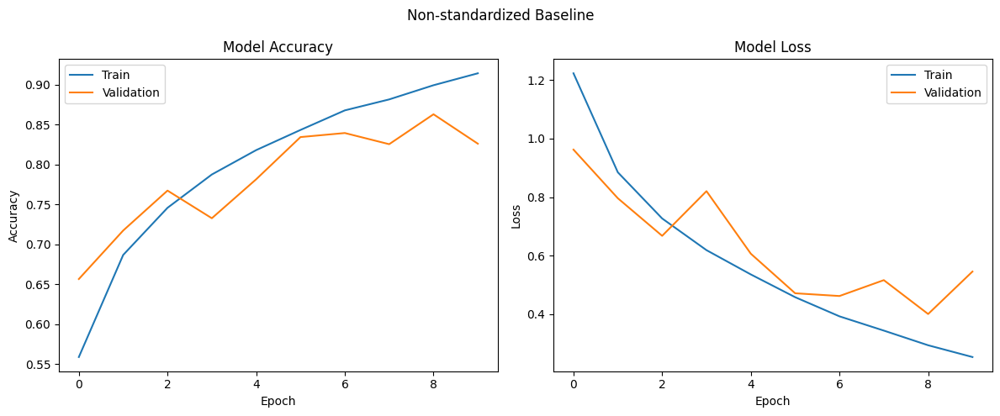

Non-standardized validation accuracy: 0.8629
Memory cleared


In [78]:

if not is_completed('non_standardized_baseline'):
    print("\nTraining baseline model with non-standardized data...")
    non_stand_model, non_stand_history = train_model(
        X_train_norm, y_train_split,
        X_val_norm, y_val_split,
        model_name="non_standardized_baseline",
        epochs=10
    )
    non_stand_acc = max(non_stand_history.history['val_accuracy'])
    save_checkpoint(non_stand_model, non_stand_history, 'non_standardized_baseline')
    plot_history(non_stand_history, "Non-standardized Baseline")
    print(f"Non-standardized validation accuracy: {non_stand_acc:.4f}")
    
  
    del non_stand_model
    clear_memory()
else:
    print("Loading from previous session...")
    with open('/kaggle/working/results/non_standardized_baseline_history.pkl', 'rb') as f:
        non_stand_history = type('', (), {})()
        non_stand_history.history = pickle.load(f)
    non_stand_acc = max(non_stand_history.history['val_accuracy'])
    print(f"Loaded non-standardized baseline with accuracy: {non_stand_acc:.4f}")

stand training


Training baseline model with standardized data...
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,559 (435.78 KB)

 Trainable params: 111,111 (434.03 KB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.4725 - loss: 1.4272 - val_accuracy: 0.6623 - val_loss: 0.9042 - learning_rate: 0.0010
Epoch 2/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6754 - loss: 0.9236 - val_accuracy: 0.7083 - val_loss: 0.8579 - learning_rate: 0.0010
Epoch 3/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7382 - loss: 0.7419 - val_accuracy: 0.7746 - val_loss: 0.6704 - learning_rate: 0.0010
Epoch 4/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7806 - loss: 0.6280 - val_accuracy: 0.7458 - val_loss: 0.7202 - learning_rate: 0.0010
Epoch 5/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8147 - loss: 0.5376 - val_accuracy: 0.8329 - val_loss: 0.4830 - learning_rate: 0.0010
Epoch 6/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8479 - loss: 0.4442 - val_accuracy: 0.8288 - val_loss: 0.5035 - learning_rate: 0.0010
Epoch 7/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8687 - loss: 0.3983 -

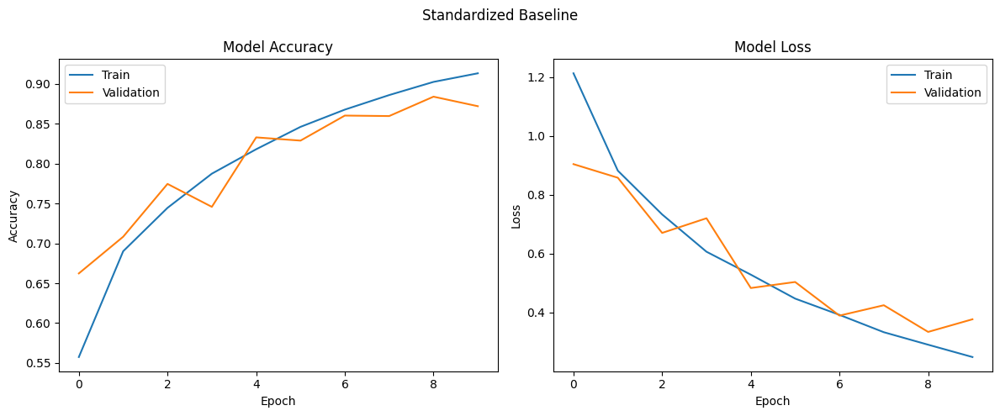

Standardized validation accuracy: 0.8839
Memory cleared


In [79]:

if not is_completed('standardized_baseline'):
    print("\nTraining baseline model with standardized data...")
    stand_model, stand_history = train_model(
        X_train_std, y_train_split,
        X_val_std, y_val_split,
        model_name="standardized_baseline",
        epochs=10
    )
    stand_acc = max(stand_history.history['val_accuracy'])
    save_checkpoint(stand_model, stand_history, 'standardized_baseline')
    plot_history(stand_history, "Standardized Baseline")
    print(f"Standardized validation accuracy: {stand_acc:.4f}")
    
    # Free memory
    del stand_model
    clear_memory()
else:
    print("Loading from previous session...")
    with open('/kaggle/working/results/standardized_baseline_history.pkl', 'rb') as f:
        stand_history = type('', (), {})()
        stand_history.history = pickle.load(f)
    stand_acc = max(stand_history.history['val_accuracy'])
    print(f"Loaded standardized baseline with accuracy: {stand_acc:.4f}")

choose best model of stand and non stand

In [80]:
if stand_acc > non_stand_acc:
    print("\nStandardized data performs better - using for hyperparameter exploration")
    X_train_final = X_train_std
    X_val_final = X_val_std
    preprocessing = "standardized"
else:
    print("\nNon-standardized data performs better - using for hyperparameter exploration")
    X_train_final = X_train_norm
    X_val_final = X_val_norm
    preprocessing = "normalized"

print(f"Selected preprocessing: {preprocessing}")


Standardized data performs better - using for hyperparameter exploration
Selected preprocessing: standardized


the stand data have better accuracy so we will use it

explore batch size


Exploring batch sizes...

Training with batch size: 16
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,559 (435.78 KB)

 Trainable params: 111,111 (434.03 KB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.4562 - loss: 1.4950 - val_accuracy: 0.6569 - val_loss: 0.9498 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6590 - loss: 0.9549 - val_accuracy: 0.7130 - val_loss: 0.8636 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.7267 - loss: 0.7912 - val_accuracy: 0.7663 - val_loss: 0.6649 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.7732 - loss: 0.6495 - val_accuracy: 0.8082 - val_loss: 0.5539 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8078 - loss: 0.5607 - val_accuracy: 0.8396 - val_loss: 0.4664 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8323 - loss: 0.4901 - val_accuracy: 0.8546 - val_loss: 0.4307 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8513 - 

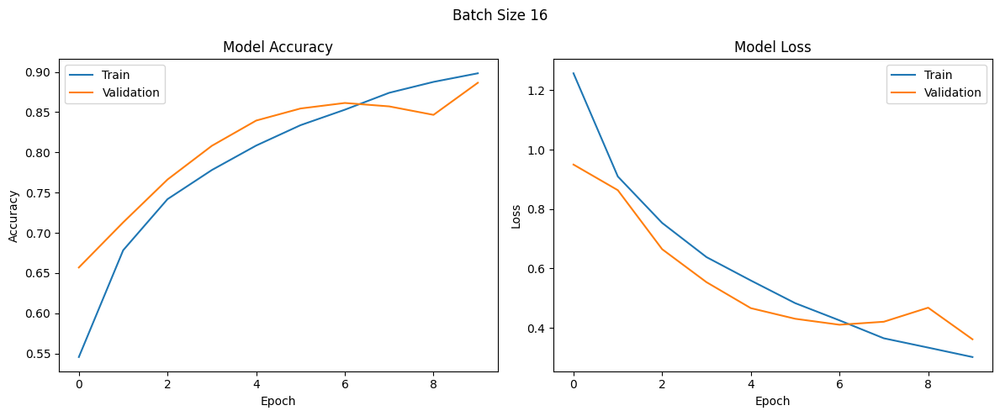

✓ Saved checkpoint: batch_size_16
Memory cleared

Training with batch size: 32
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,559 (435.78 KB)

 Trainable params: 111,111 (434.03 KB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.4584 - loss: 1.4974 - val_accuracy: 0.6650 - val_loss: 0.9451 - learning_rate: 0.0010
Epoch 2/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6642 - loss: 0.9466 - val_accuracy: 0.7598 - val_loss: 0.7029 - learning_rate: 0.0010
Epoch 3/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7353 - loss: 0.7540 - val_accuracy: 0.7908 - val_loss: 0.5889 - learning_rate: 0.0010
Epoch 4/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7796 - loss: 0.6343 - val_accuracy: 0.8193 - val_loss: 0.5231 - learning_rate: 0.0010
Epoch 5/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8220 - loss: 0.5197 - val_accuracy: 0.8274 - val_loss: 0.4757 - learning_rate: 0.0010
Epoch 6/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8401 - loss: 0.4621 - val_accuracy: 0.8378 - val_loss: 0.4732 - learning_rate: 0.0010
Epoch 7/10
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8618 - loss: 0.4038 -

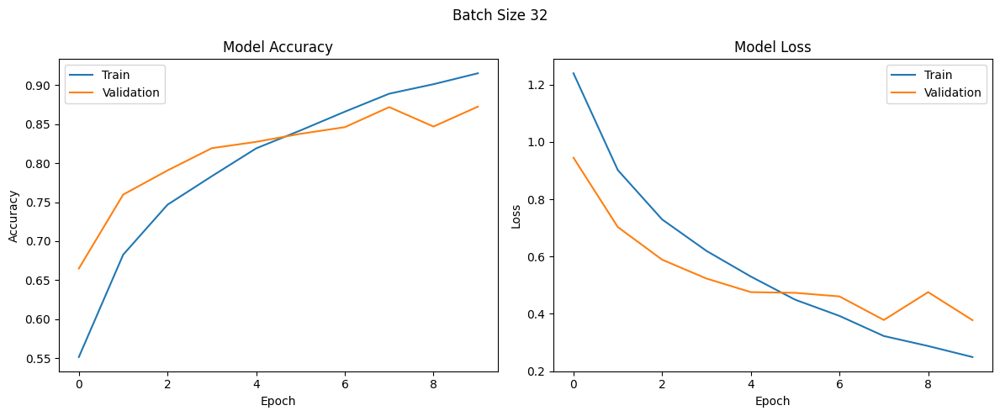

✓ Saved checkpoint: batch_size_32
Memory cleared

Training with batch size: 64
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,559 (435.78 KB)

 Trainable params: 111,111 (434.03 KB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.4549 - loss: 1.4796 - val_accuracy: 0.5299 - val_loss: 1.2460 - learning_rate: 0.0010
Epoch 2/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6668 - loss: 0.9362 - val_accuracy: 0.7347 - val_loss: 0.7466 - learning_rate: 0.0010
Epoch 3/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7399 - loss: 0.7506 - val_accuracy: 0.7699 - val_loss: 0.6478 - learning_rate: 0.0010
Epoch 4/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7737 - loss: 0.6437 - val_accuracy: 0.7910 - val_loss: 0.6153 - learning_rate: 0.0010
Epoch 5/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8139 - loss: 0.5355 - val_accuracy: 0.8189 - val_loss: 0.5103 - learning_rate: 0.0010
Epoch 6/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8327 - loss: 0.4788 - val_accuracy: 0.8309 - val_loss: 0.4790 - learning_rate: 0.0010
Epoch 7/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8632 - loss: 0.4018 

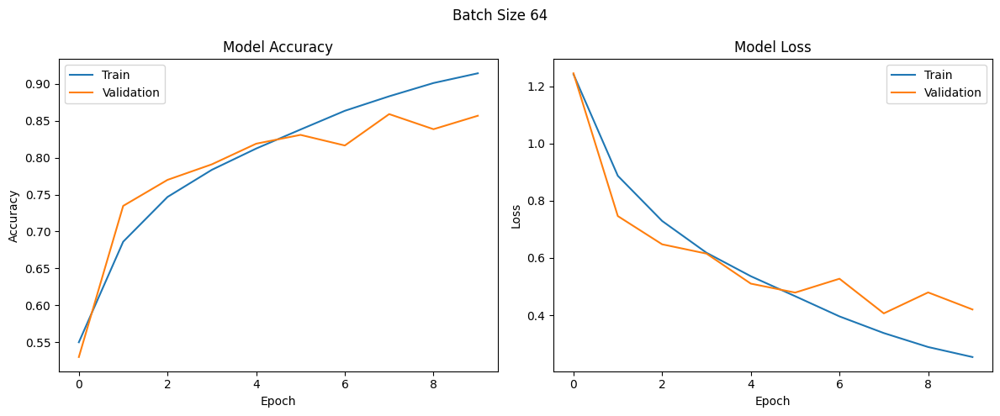

✓ Saved checkpoint: batch_size_64
Memory cleared


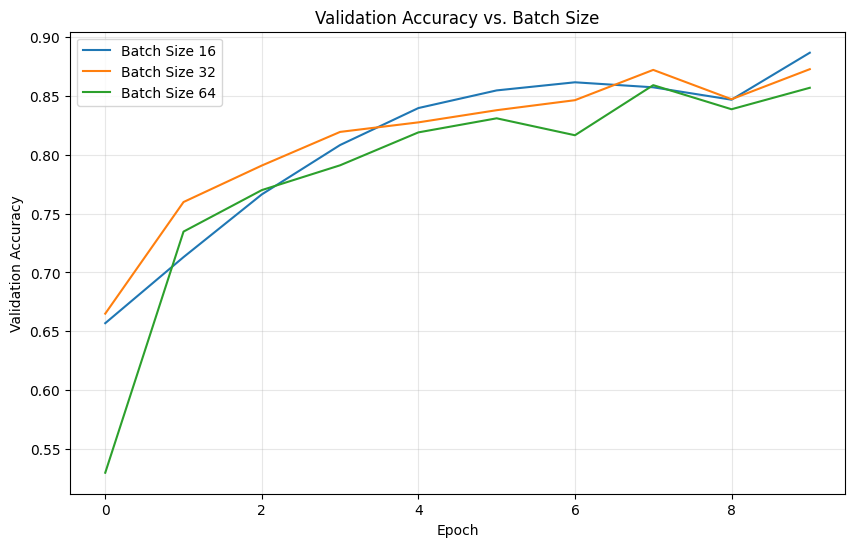


Best batch size: 16 (val_accuracy: 0.8866)


In [81]:
if not is_completed('batch_size_experiments'):
    print("\nExploring batch sizes...")
    batch_sizes = [16, 32, 64]
    batch_results = {}
    batch_histories = {}

    for bs in batch_sizes:
        print(f"\nTraining with batch size: {bs}")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=bs,
            model_name=f"batch_size_{bs}",
            epochs=10
        )
        
        batch_results[bs] = max(history.history['val_accuracy'])
        batch_histories[bs] = history
        plot_history(history, f"Batch Size {bs}")
        save_checkpoint(model, history, f"batch_size_{bs}")
        
      
        del model
        clear_memory()
    
   
    plot_batch_size_comparison(batch_histories)
    
    # Save results
    with open('/kaggle/working/results/batch_results.pkl', 'wb') as f:
        pickle.dump({'results': batch_results, 'histories': batch_histories}, f)
    
    progress['completed'].append('batch_size_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
        
#best batch size
    best_batch_size = max(batch_results, key=batch_results.get)
    print(f"\nBest batch size: {best_batch_size} (val_accuracy: {batch_results[best_batch_size]:.4f})")
else:
    print("Loading batch size experiments from previous session...")
    with open('/kaggle/working/results/batch_results.pkl', 'rb') as f:
        data = pickle.load(f)
        batch_results = data['results']
    
    best_batch_size = max(batch_results, key=batch_results.get)
    print(f"Best batch size: {best_batch_size} (val_accuracy: {batch_results[best_batch_size]:.4f})")

explore number of layers


Exploring number of layers...

Training with 2 layers
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 64)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,999 (113.28 KB)

 Trainable params: 28,807 (112.53 KB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.4307 - loss: 1.4822 - val_accuracy: 0.5949 - val_loss: 1.0870 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6182 - loss: 1.0423 - val_accuracy: 0.6946 - val_loss: 0.8699 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6763 - loss: 0.9069 - val_accuracy: 0.7213 - val_loss: 0.7905 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7114 - loss: 0.8173 - val_accuracy: 0.7237 - val_loss: 0.7764 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7349 - loss: 0.7465 - val_accuracy: 0.7624 - val_loss: 0.6718 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7585 - loss: 0.6882 - val_accuracy: 0.7873 - val_loss: 0.6117 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7802 - 

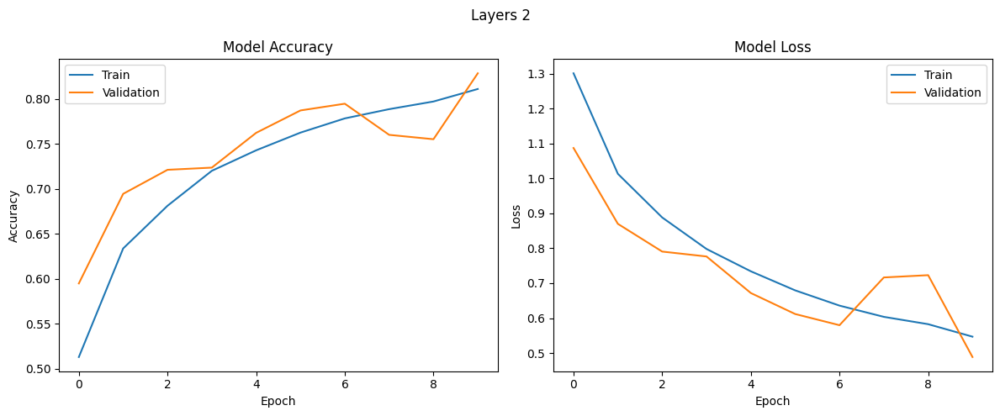

✓ Saved checkpoint: layers_2
Memory cleared

Training with 3 layers
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,559 (435.78 KB)

 Trainable params: 111,111 (434.03 KB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.4681 - loss: 1.4461 - val_accuracy: 0.6557 - val_loss: 0.9598 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6642 - loss: 0.9560 - val_accuracy: 0.7243 - val_loss: 0.7999 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.7208 - loss: 0.7934 - val_accuracy: 0.7417 - val_loss: 0.7843 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.7755 - loss: 0.6555 - val_accuracy: 0.7697 - val_loss: 0.6588 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8031 - loss: 0.5668 - val_accuracy: 0.7871 - val_loss: 0.6854 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8241 - loss: 0.4961 - val_accuracy: 0.8327 - val_loss: 0.5078 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8550 - 

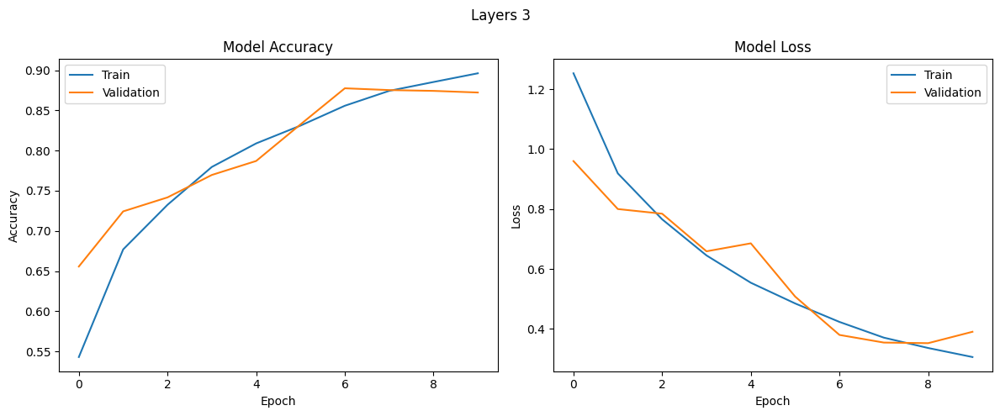

✓ Saved checkpoint: layers_3
Memory cleared

Training with 4 layers
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.4611 - loss: 1.5603 - val_accuracy: 0.6830 - val_loss: 0.8869 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6820 - loss: 0.9076 - val_accuracy: 0.7241 - val_loss: 0.7987 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7486 - loss: 0.7278 - val_accuracy: 0.8023 - val_loss: 0.5683 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7977 - loss: 0.5936 - val_accuracy: 0.8471 - val_loss: 0.4418 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8468 - loss: 0.4513 - val_accuracy: 0.8689 - val_loss: 0.3849 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8737 - loss: 0.3759 - val_accuracy: 0.8426 - val_loss: 0.4786 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9017 - 

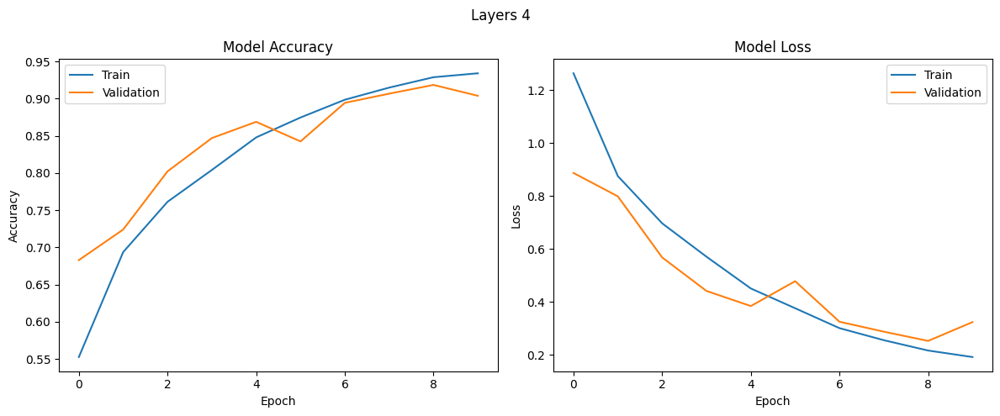

✓ Saved checkpoint: layers_4
Memory cleared


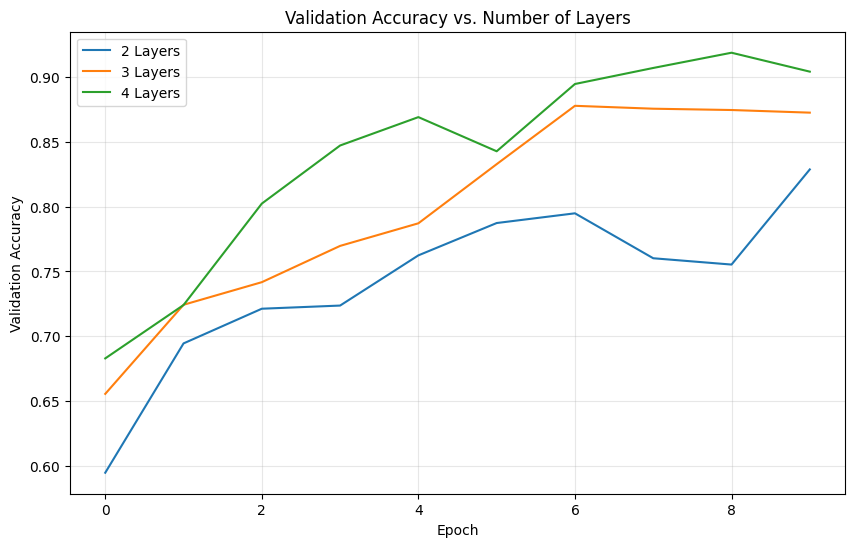


Best number of layers: 4 (val_accuracy: 0.9186)


In [82]:
if not is_completed('layer_experiments'):
    print("\nExploring number of layers...")
    num_layers_options = [2, 3, 4]
    layer_results = {}
    layer_histories = {}

    for nl in num_layers_options:
        print(f"\nTraining with {nl} layers")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=best_batch_size,
            num_layers=nl,
            model_name=f"layers_{nl}",
            epochs=10
        )
        
        layer_results[nl] = max(history.history['val_accuracy'])
        layer_histories[nl] = history
        plot_history(history, f"Layers {nl}")
        save_checkpoint(model, history, f"layers_{nl}")
        
       
        del model
        clear_memory()
    
    
    plot_layer_comparison(layer_histories)
    
    
    with open('/kaggle/working/results/layer_results.pkl', 'wb') as f:
        pickle.dump({'results': layer_results, 'histories': layer_histories}, f)
    
    progress['completed'].append('layer_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
        
    # Get best number of layers
    best_num_layers = max(layer_results, key=layer_results.get)
    print(f"\nBest number of layers: {best_num_layers} (val_accuracy: {layer_results[best_num_layers]:.4f})")
else:
    print("Loading layer experiments from previous session...")
    with open('/kaggle/working/results/layer_results.pkl', 'rb') as f:
        data = pickle.load(f)
        layer_results = data['results']
    
    best_num_layers = max(layer_results, key=layer_results.get)
    print(f"Best number of layers: {best_num_layers} (val_accuracy: {layer_results[best_num_layers]:.4f})")

explore of droupout rate


Exploring dropout rates...

Training with dropout rate: 0.3
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.5046 - loss: 1.4088 - val_accuracy: 0.7041 - val_loss: 0.8426 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7137 - loss: 0.8185 - val_accuracy: 0.7586 - val_loss: 0.6831 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7766 - loss: 0.6338 - val_accuracy: 0.8290 - val_loss: 0.4942 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8265 - loss: 0.4899 - val_accuracy: 0.8477 - val_loss: 0.4514 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8753 - loss: 0.3686 - val_accuracy: 0.8311 - val_loss: 0.5334 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8998 - loss: 0.2906 - val_accuracy: 0.8902 - val_loss: 0.3276 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9271 - 

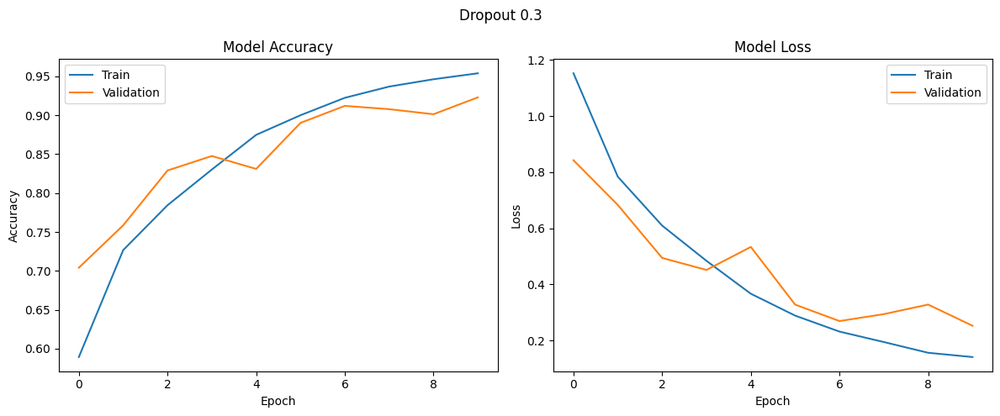

✓ Saved checkpoint: dropout_0.3
Memory cleared

Training with dropout rate: 0.5
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.4659 - loss: 1.5327 - val_accuracy: 0.6816 - val_loss: 0.8587 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6834 - loss: 0.9104 - val_accuracy: 0.7571 - val_loss: 0.6710 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7472 - loss: 0.7335 - val_accuracy: 0.8037 - val_loss: 0.5812 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7998 - loss: 0.5872 - val_accuracy: 0.8232 - val_loss: 0.5227 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8405 - loss: 0.4675 - val_accuracy: 0.8623 - val_loss: 0.3911 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8719 - loss: 0.3701 - val_accuracy: 0.8459 - val_loss: 0.4512 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8972 - 

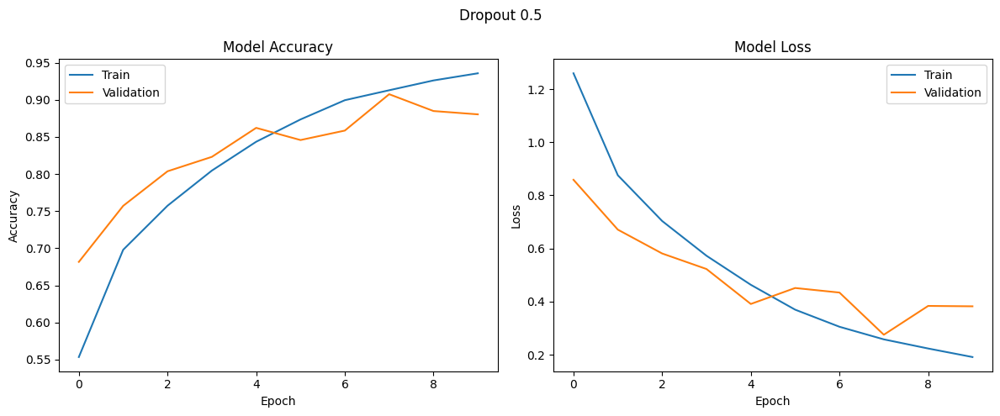

✓ Saved checkpoint: dropout_0.5
Memory cleared

Training with dropout rate: 0.7
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.4236 - loss: 1.6793 - val_accuracy: 0.6372 - val_loss: 0.9985 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6200 - loss: 1.0858 - val_accuracy: 0.7176 - val_loss: 0.8172 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6971 - loss: 0.8774 - val_accuracy: 0.6952 - val_loss: 0.8681 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7490 - loss: 0.7447 - val_accuracy: 0.7679 - val_loss: 0.6562 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7913 - loss: 0.6181 - val_accuracy: 0.8349 - val_loss: 0.4769 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8223 - loss: 0.5378 - val_accuracy: 0.8240 - val_loss: 0.5615 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8522 - 

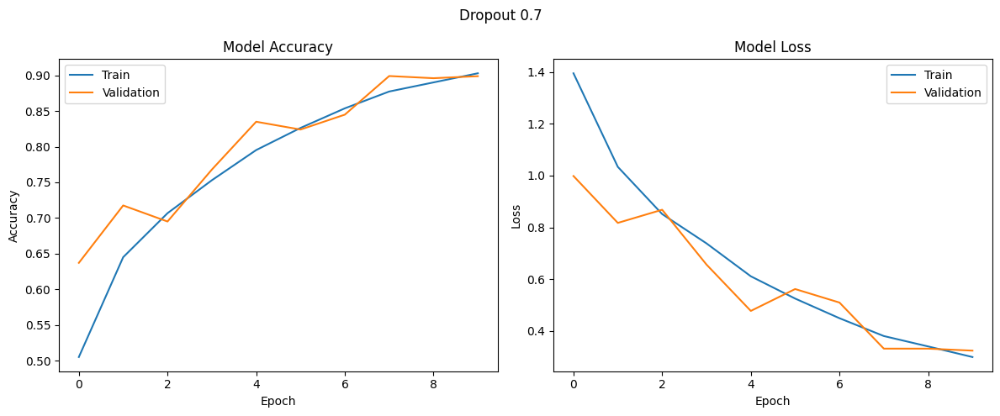

✓ Saved checkpoint: dropout_0.7
Memory cleared


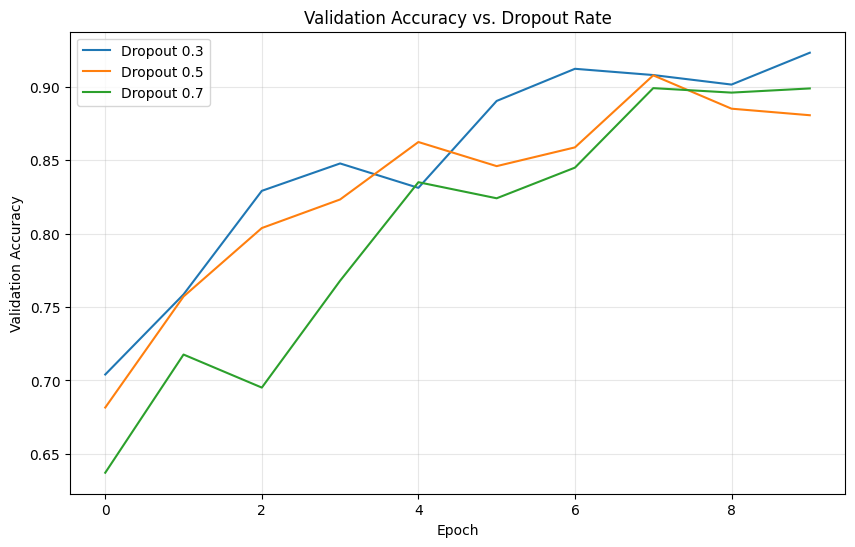


Best dropout rate: 0.3 (val_accuracy: 0.9230)


In [83]:
if not is_completed('dropout_experiments'):
    print("\nExploring dropout rates...")
    dropout_rates = [0.3, 0.5, 0.7]
    dropout_results = {}
    dropout_histories = {}

    for dr in dropout_rates:
        print(f"\nTraining with dropout rate: {dr}")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=best_batch_size,
            num_layers=best_num_layers,
            dropout_rate=dr,
            model_name=f"dropout_{dr}",
            epochs=10
        )
        
        dropout_results[dr] = max(history.history['val_accuracy'])
        dropout_histories[dr] = history
        plot_history(history, f"Dropout {dr}")
        save_checkpoint(model, history, f"dropout_{dr}")
        
        # Free memory
        del model
        clear_memory()
    
   
    plot_dropout_comparison(dropout_histories)
    
 
    with open('/kaggle/working/results/dropout_results.pkl', 'wb') as f:
        pickle.dump({'results': dropout_results, 'histories': dropout_histories}, f)
    
    progress['completed'].append('dropout_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
        
  
    best_dropout = max(dropout_results, key=dropout_results.get)
    print(f"\nBest dropout rate: {best_dropout} (val_accuracy: {dropout_results[best_dropout]:.4f})")
else:
    print("Loading dropout experiments from previous session...")
    with open('/kaggle/working/results/dropout_results.pkl', 'rb') as f:
        data = pickle.load(f)
        dropout_results = data['results']
    
    best_dropout = max(dropout_results, key=dropout_results.get)
    print(f"Best dropout rate: {best_dropout} (val_accuracy: {dropout_results[best_dropout]:.4f})")

explore optimizer


Exploring optimizers...

Training with optimizer: sgd
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.4912 - loss: 1.3874 - val_accuracy: 0.6954 - val_loss: 0.8734 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6795 - loss: 0.9113 - val_accuracy: 0.7697 - val_loss: 0.6663 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7397 - loss: 0.7282 - val_accuracy: 0.7885 - val_loss: 0.6063 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7866 - loss: 0.6092 - val_accuracy: 0.8467 - val_loss: 0.4536 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8268 - loss: 0.4993 - val_accuracy: 0.8592 - val_loss: 0.4261 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8516 - loss: 0.4228 - val_accuracy: 0.8570 - val_loss: 0.4057 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8778 - 

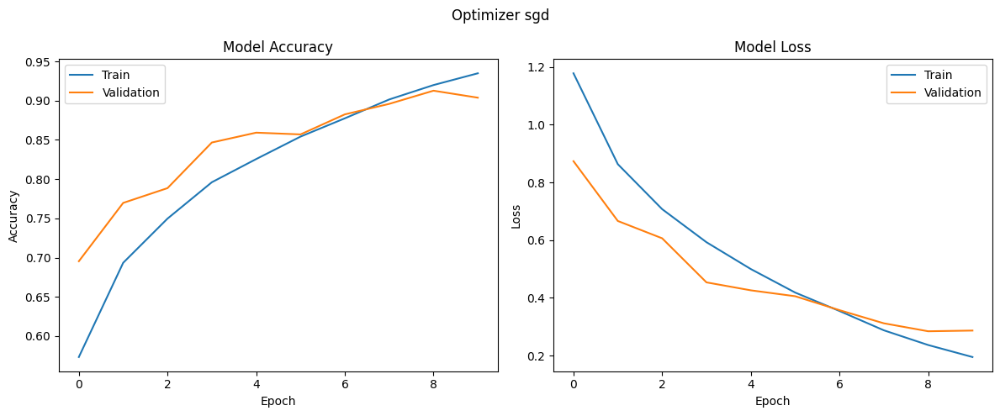

✓ Saved checkpoint: optimizer_sgd
Memory cleared

Training with optimizer: adam
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.4947 - loss: 1.4445 - val_accuracy: 0.7045 - val_loss: 0.7893 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7135 - loss: 0.8277 - val_accuracy: 0.7701 - val_loss: 0.6575 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7751 - loss: 0.6443 - val_accuracy: 0.7837 - val_loss: 0.6530 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8349 - loss: 0.4738 - val_accuracy: 0.8080 - val_loss: 0.5728 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8670 - loss: 0.3911 - val_accuracy: 0.8062 - val_loss: 0.6047 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9055 - loss: 0.2885 - val_accuracy: 0.8738 - val_loss: 0.3840 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9190 - 

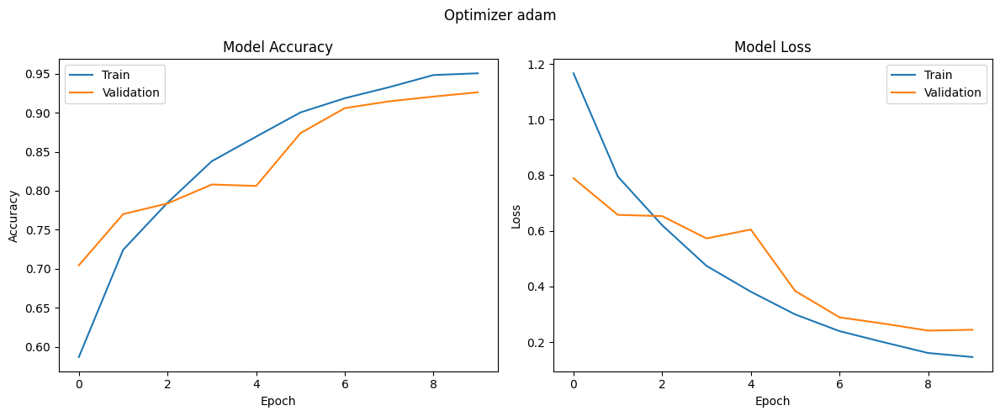

✓ Saved checkpoint: optimizer_adam
Memory cleared

Training with optimizer: rmsprop
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.4817 - loss: 1.5214 - val_accuracy: 0.6925 - val_loss: 0.8690 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7158 - loss: 0.8279 - val_accuracy: 0.7904 - val_loss: 0.6068 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7925 - loss: 0.6218 - val_accuracy: 0.8284 - val_loss: 0.5196 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8321 - loss: 0.4948 - val_accuracy: 0.8078 - val_loss: 0.6201 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8631 - loss: 0.4124 - val_accuracy: 0.8268 - val_loss: 0.6562 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8934 - loss: 0.3230 - val_accuracy: 0.8718 - val_loss: 0.5061 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9077 - 

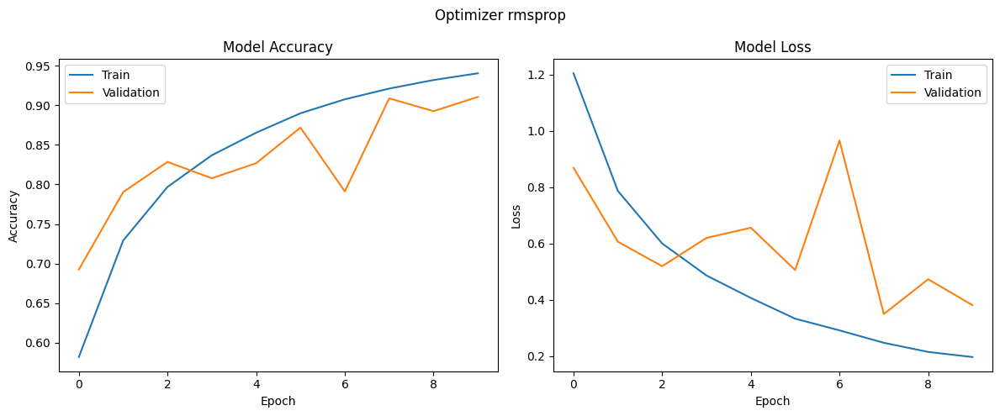

✓ Saved checkpoint: optimizer_rmsprop
Memory cleared


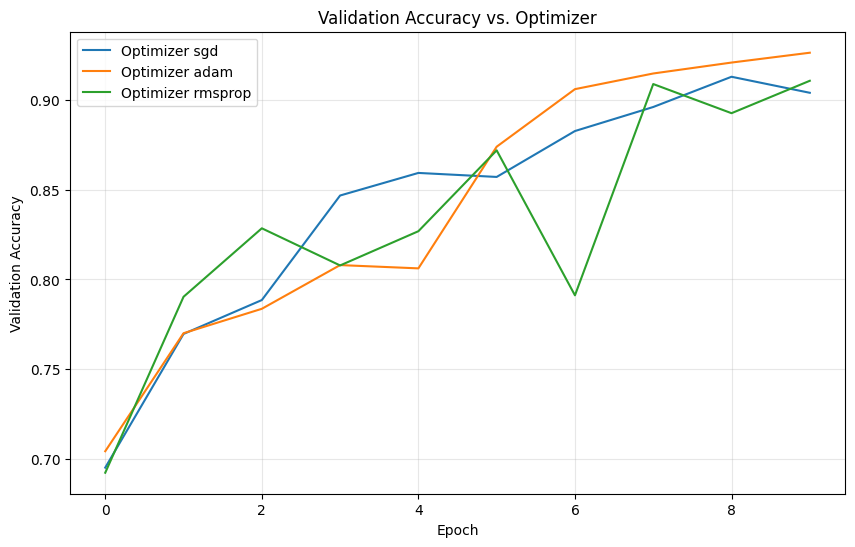


Best optimizer: adam (val_accuracy: 0.9261)


In [84]:
if not is_completed('optimizer_experiments'):
    print("\nExploring optimizers...")
    optimizers = ['sgd', 'adam', 'rmsprop']
    optimizer_results = {}
    optimizer_histories = {}

    for opt in optimizers:
        print(f"\nTraining with optimizer: {opt}")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=best_batch_size,
            num_layers=best_num_layers,
            dropout_rate=best_dropout,
            optimizer_name=opt,
            model_name=f"optimizer_{opt}",
            epochs=10
        )
        
        optimizer_results[opt] = max(history.history['val_accuracy'])
        optimizer_histories[opt] = history
        plot_history(history, f"Optimizer {opt}")
        save_checkpoint(model, history, f"optimizer_{opt}")
        
        
        del model
        clear_memory()
    
 
    plot_optimizer_comparison(optimizer_histories)
    

    with open('/kaggle/working/results/optimizer_results.pkl', 'wb') as f:
        pickle.dump({'results': optimizer_results, 'histories': optimizer_histories}, f)
    
    progress['completed'].append('optimizer_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
        
 
    best_optimizer = max(optimizer_results, key=optimizer_results.get)
    print(f"\nBest optimizer: {best_optimizer} (val_accuracy: {optimizer_results[best_optimizer]:.4f})")
else:
    print("Loading optimizer experiments from previous session...")
    with open('/kaggle/working/results/optimizer_results.pkl', 'rb') as f:
        data = pickle.load(f)
        optimizer_results = data['results']
    
    best_optimizer = max(optimizer_results, key=optimizer_results.get)
    print(f"Best optimizer: {best_optimizer} (val_accuracy: {optimizer_results[best_optimizer]:.4f})")

explore weight decay


Exploring weight decay values...

Training with weight decay: 0.0
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.5037 - loss: 1.4089 - val_accuracy: 0.6840 - val_loss: 0.8864 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6976 - loss: 0.8456 - val_accuracy: 0.7642 - val_loss: 0.6667 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7754 - loss: 0.6339 - val_accuracy: 0.8252 - val_loss: 0.4874 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8282 - loss: 0.4899 - val_accuracy: 0.8327 - val_loss: 0.4734 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8741 - loss: 0.3624 - val_accuracy: 0.8244 - val_loss: 0.5652 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8964 - loss: 0.2975 - val_accuracy: 0.8993 - val_loss: 0.3057 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9259 - 

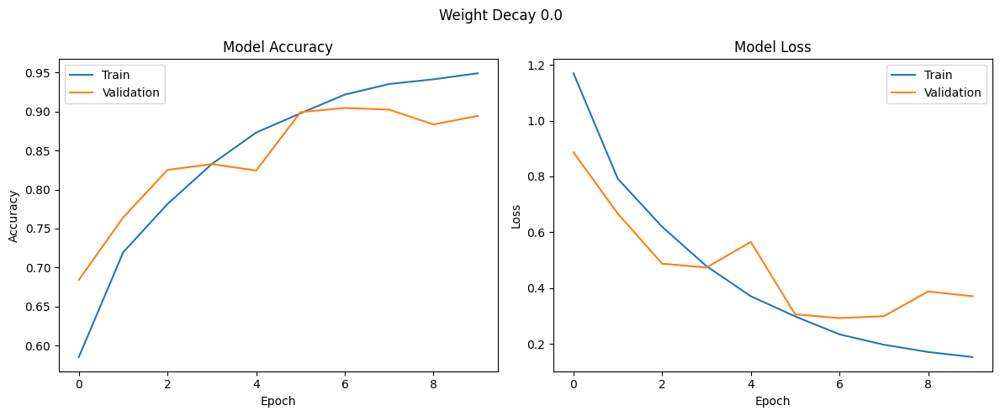

✓ Saved checkpoint: weight_decay_0.0
Memory cleared

Training with weight decay: 0.0001
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.5098 - loss: 1.3998 - val_accuracy: 0.6636 - val_loss: 0.8969 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7164 - loss: 0.7971 - val_accuracy: 0.7658 - val_loss: 0.6847 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7904 - loss: 0.6043 - val_accuracy: 0.8058 - val_loss: 0.6243 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8330 - loss: 0.4764 - val_accuracy: 0.8604 - val_loss: 0.4186 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8808 - loss: 0.3577 - val_accuracy: 0.8884 - val_loss: 0.3223 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9130 - loss: 0.2575 - val_accuracy: 0.8892 - val_loss: 0.3414 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9278 - 

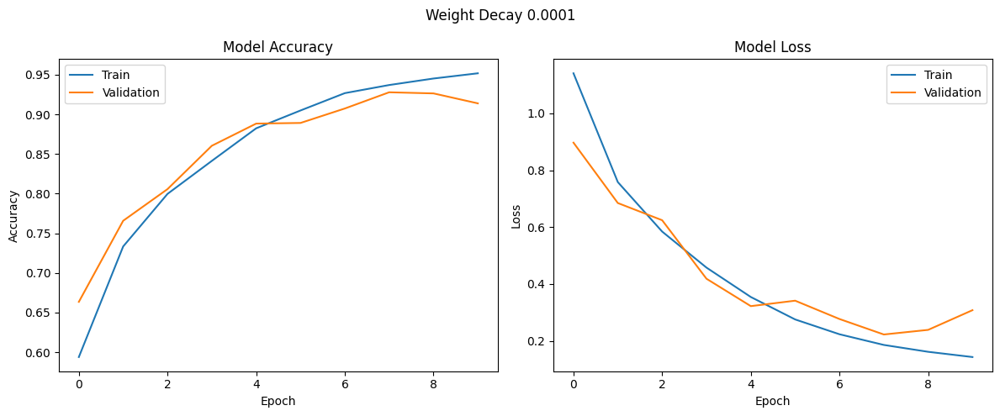

✓ Saved checkpoint: weight_decay_0.0001
Memory cleared

Training with weight decay: 0.001
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.4998 - loss: 1.4324 - val_accuracy: 0.6862 - val_loss: 0.8981 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7013 - loss: 0.8394 - val_accuracy: 0.7869 - val_loss: 0.6025 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7740 - loss: 0.6435 - val_accuracy: 0.7794 - val_loss: 0.6805 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8257 - loss: 0.4929 - val_accuracy: 0.8479 - val_loss: 0.4397 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8679 - loss: 0.3815 - val_accuracy: 0.8475 - val_loss: 0.4569 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9010 - loss: 0.2856 - val_accuracy: 0.8999 - val_loss: 0.2975 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9190 - 

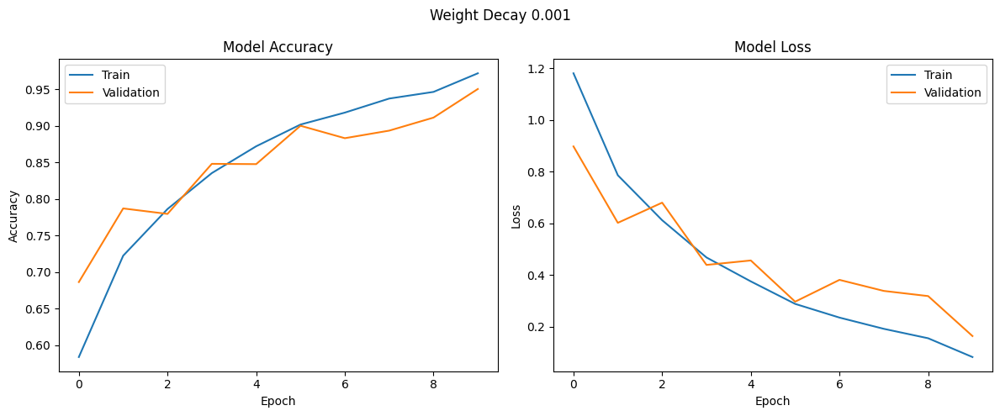

✓ Saved checkpoint: weight_decay_0.001
Memory cleared


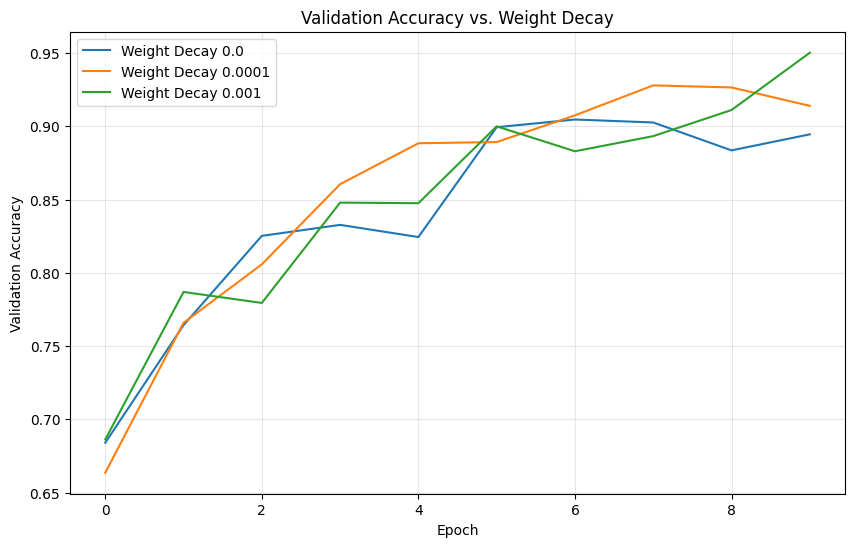


Best weight decay: 0.001 (val_accuracy: 0.9502)


In [85]:
if not is_completed('weight_decay_experiments'):
    print("\nExploring weight decay values...")
    weight_decays = [0.0, 0.0001, 0.001]
    wd_results = {}
    wd_histories = {}

    for wd in weight_decays:
        print(f"\nTraining with weight decay: {wd}")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=best_batch_size,
            num_layers=best_num_layers,
            dropout_rate=best_dropout,
            optimizer_name=best_optimizer,
            weight_decay=wd,
            model_name=f"weight_decay_{wd}",
            epochs=10
        )
        
        wd_results[wd] = max(history.history['val_accuracy'])
        wd_histories[wd] = history
        plot_history(history, f"Weight Decay {wd}")
        save_checkpoint(model, history, f"weight_decay_{wd}")
        
       
        del model
        clear_memory()
    
    
    plot_weight_decay_comparison(wd_histories)
    

    with open('/kaggle/working/results/wd_results.pkl', 'wb') as f:
        pickle.dump({'results': wd_results, 'histories': wd_histories}, f)
    
    progress['completed'].append('weight_decay_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
        
 
    best_weight_decay = max(wd_results, key=wd_results.get)
    print(f"\nBest weight decay: {best_weight_decay} (val_accuracy: {wd_results[best_weight_decay]:.4f})")
else:
    print("Loading weight decay experiments from previous session...")
    with open('/kaggle/working/results/wd_results.pkl', 'rb') as f:
        data = pickle.load(f)
        wd_results = data['results']
    
    best_weight_decay = max(wd_results, key=wd_results.get)
    print(f"Best weight decay: {best_weight_decay} (val_accuracy: {wd_results[best_weight_decay]:.4f})")

explore learning rate


Exploring learning rates...

Training with learning rate: 0.01
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.3782 - loss: 1.9015 - val_accuracy: 0.5744 - val_loss: 1.1880 - learning_rate: 0.0100
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.5623 - loss: 1.2218 - val_accuracy: 0.5165 - val_loss: 1.7919 - learning_rate: 0.0100
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6429 - loss: 1.0183 - val_accuracy: 0.6081 - val_loss: 1.2140 - learning_rate: 0.0100
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6811 - loss: 0.9116 - val_accuracy: 0.7272 - val_loss: 0.8202 - learning_rate: 0.0100
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7167 - loss: 0.8363 - val_accuracy: 0.7776 - val_loss: 0.6594 - learning_rate: 0.0100
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7551 - loss: 0.7445 - val_accuracy: 0.7685 - val_loss: 0.7066 - learning_rate: 0.0100
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7628 - 

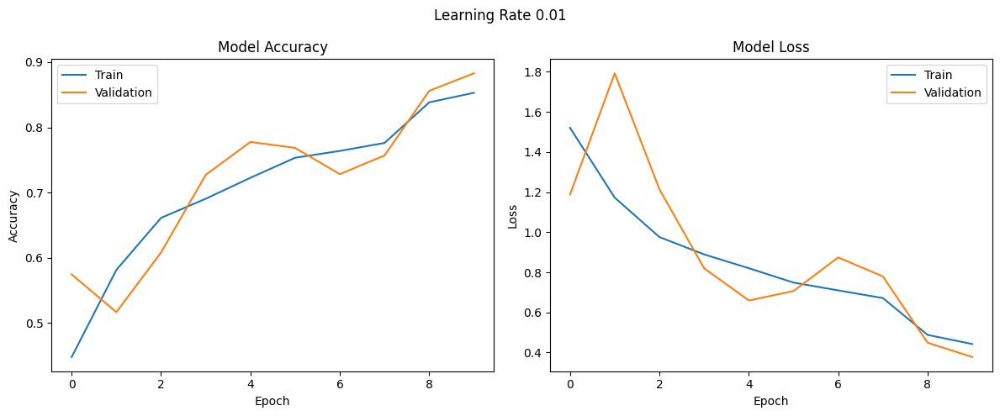

✓ Saved checkpoint: learning_rate_0.01
Memory cleared

Training with learning rate: 0.001
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.4845 - loss: 1.4443 - val_accuracy: 0.6854 - val_loss: 0.8525 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7056 - loss: 0.8375 - val_accuracy: 0.7772 - val_loss: 0.6374 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7767 - loss: 0.6377 - val_accuracy: 0.7902 - val_loss: 0.6029 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8318 - loss: 0.4910 - val_accuracy: 0.8388 - val_loss: 0.4589 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8718 - loss: 0.3743 - val_accuracy: 0.8386 - val_loss: 0.4592 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9018 - loss: 0.2927 - val_accuracy: 0.9048 - val_loss: 0.3010 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9299 - 

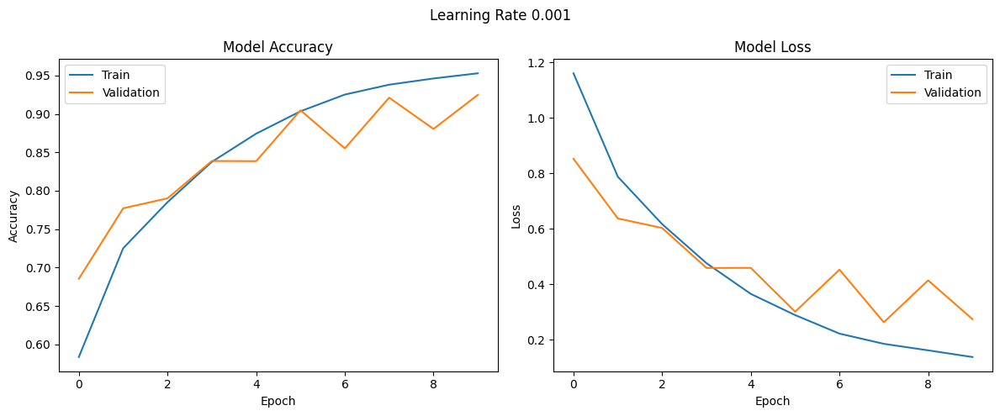

✓ Saved checkpoint: learning_rate_0.001
Memory cleared

Training with learning rate: 0.0001
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.4902 - loss: 1.4143 - val_accuracy: 0.7205 - val_loss: 0.8010 - learning_rate: 1.0000e-04
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6974 - loss: 0.8616 - val_accuracy: 0.7527 - val_loss: 0.7020 - learning_rate: 1.0000e-04
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7486 - loss: 0.7283 - val_accuracy: 0.8076 - val_loss: 0.5471 - learning_rate: 1.0000e-04
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7934 - loss: 0.5915 - val_accuracy: 0.8534 - val_loss: 0.4429 - learning_rate: 1.0000e-04
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8408 - loss: 0.4636 - val_accuracy: 0.8424 - val_loss: 0.4700 - learning_rate: 1.0000e-04
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8738 - loss: 0.3773 - val_accuracy: 0.8768 - val_loss: 0.3710 - learning_rate: 1.0000e-04
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/st

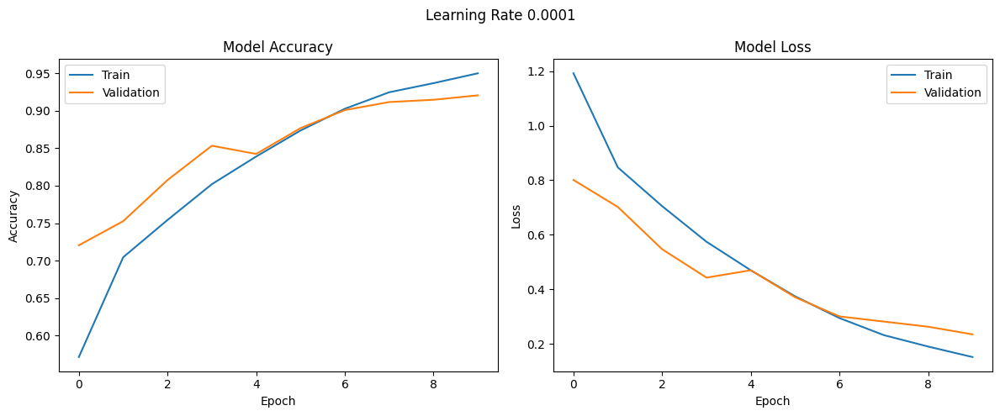

✓ Saved checkpoint: learning_rate_0.0001
Memory cleared


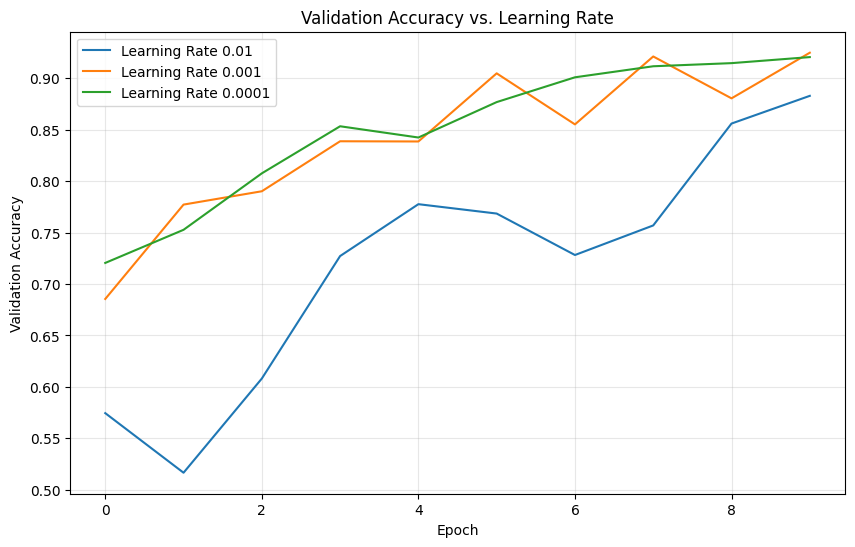


Best learning rate: 0.001 (val_accuracy: 0.9249)


In [86]:
if not is_completed('learning_rate_experiments'):
    print("\nExploring learning rates...")
    learning_rates = [0.01, 0.001, 0.0001]
    lr_results = {}
    lr_histories = {}

    for lr in learning_rates:
        print(f"\nTraining with learning rate: {lr}")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=best_batch_size,
            num_layers=best_num_layers,
            dropout_rate=best_dropout,
            optimizer_name=best_optimizer,
            weight_decay=best_weight_decay,
            learning_rate=lr,
            model_name=f"learning_rate_{lr}",
            epochs=10
        )
        
        lr_results[lr] = max(history.history['val_accuracy'])
        lr_histories[lr] = history
        plot_history(history, f"Learning Rate {lr}")
        save_checkpoint(model, history, f"learning_rate_{lr}")
        
   
        del model
        clear_memory()
    
 
    plot_learning_rate_comparison(lr_histories)
    
    # Save results
    with open('/kaggle/working/results/lr_results.pkl', 'wb') as f:
        pickle.dump({'results': lr_results, 'histories': lr_histories}, f)
    
    progress['completed'].append('learning_rate_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)

    best_learning_rate = max(lr_results, key=lr_results.get)
    print(f"\nBest learning rate: {best_learning_rate} (val_accuracy: {lr_results[best_learning_rate]:.4f})")
else:
    print("Loading learning rate experiments from previous session...")
    with open('/kaggle/working/results/lr_results.pkl', 'rb') as f:
        data = pickle.load(f)
        lr_results = data['results']
    
    best_learning_rate = max(lr_results, key=lr_results.get)
    print(f"Best learning rate: {best_learning_rate} (val_accuracy: {lr_results[best_learning_rate]:.4f})")

lr schudler using explore


Exploring learning rate scheduler...

Training with learning rate scheduler: False
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.5185 - loss: 1.3834 - val_accuracy: 0.7010 - val_loss: 0.8191
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7140 - loss: 0.8191 - val_accuracy: 0.7916 - val_loss: 0.6082
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7914 - loss: 0.6098 - val_accuracy: 0.7470 - val_loss: 0.7858
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8332 - loss: 0.4826 - val_accuracy: 0.8426 - val_loss: 0.4693
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8660 - loss: 0.3810 - val_accuracy: 0.8722 - val_loss: 0.3732
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9045 - loss: 0.2827 - val_accuracy: 0.9129 - val_loss: 0.2761
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9245 - loss: 0.2278 - val_accuracy: 0.9095 - val_loss: 0.2818
Epoch 8/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9374 - loss: 0.1842 -

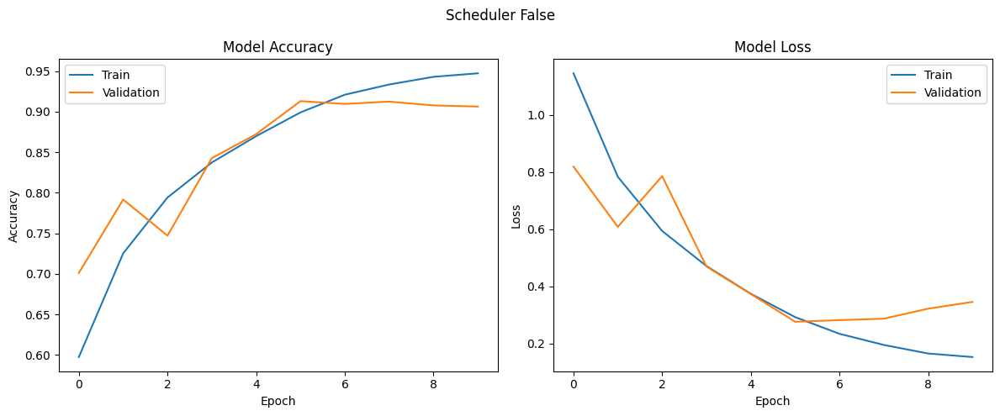

✓ Saved checkpoint: scheduler_False
Memory cleared

Training with learning rate scheduler: True
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.5058 - loss: 1.4067 - val_accuracy: 0.7253 - val_loss: 0.7626 - learning_rate: 0.0010
Epoch 2/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7036 - loss: 0.8403 - val_accuracy: 0.8041 - val_loss: 0.5580 - learning_rate: 0.0010
Epoch 3/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7766 - loss: 0.6343 - val_accuracy: 0.8151 - val_loss: 0.5434 - learning_rate: 0.0010
Epoch 4/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8341 - loss: 0.4777 - val_accuracy: 0.8313 - val_loss: 0.4881 - learning_rate: 0.0010
Epoch 5/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8721 - loss: 0.3715 - val_accuracy: 0.8951 - val_loss: 0.3322 - learning_rate: 0.0010
Epoch 6/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9111 - loss: 0.2761 - val_accuracy: 0.8791 - val_loss: 0.3679 - learning_rate: 0.0010
Epoch 7/10
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9205 - 

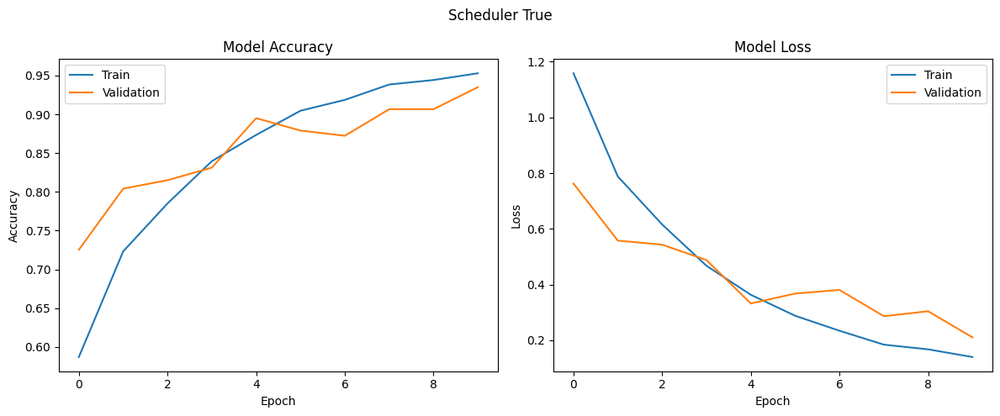

✓ Saved checkpoint: scheduler_True
Memory cleared


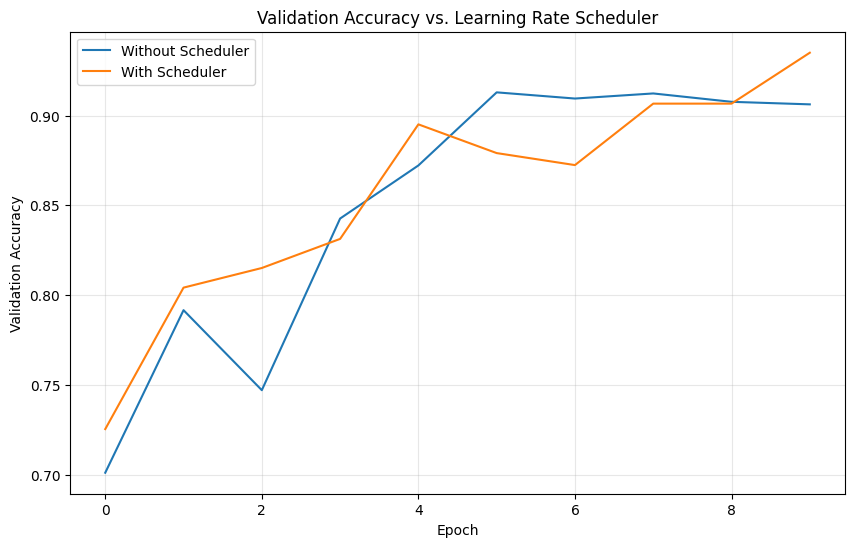


Best scheduler option: True (val_accuracy: 0.9350)


In [87]:
if not is_completed('scheduler_experiments'):
    print("\nExploring learning rate scheduler...")
    scheduler_options = [False, True]
    scheduler_results = {}
    scheduler_histories = {}

    for use_scheduler in scheduler_options:
        print(f"\nTraining with learning rate scheduler: {use_scheduler}")
        model, history = train_model(
            X_train_final, y_train_split,
            X_val_final, y_val_split,
            batch_size=best_batch_size,
            num_layers=best_num_layers,
            dropout_rate=best_dropout,
            optimizer_name=best_optimizer,
            weight_decay=best_weight_decay,
            learning_rate=best_learning_rate,
            use_scheduler=use_scheduler,
            model_name=f"scheduler_{use_scheduler}",
            epochs=10
        )
        
        scheduler_results[use_scheduler] = max(history.history['val_accuracy'])
        scheduler_histories[use_scheduler] = history
        plot_history(history, f"Scheduler {use_scheduler}")
        save_checkpoint(model, history, f"scheduler_{use_scheduler}")
        
       
        del model
        clear_memory()
    
    # Plot scheduler comparison using the dedicated function
    plot_scheduler_comparison(scheduler_histories)
    
    # Save results
    with open('/kaggle/working/results/scheduler_results.pkl', 'wb') as f:
        pickle.dump({'results': scheduler_results, 'histories': scheduler_histories}, f)
    
    progress['completed'].append('scheduler_experiments')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
        
    # Get best scheduler option
    best_scheduler = max(scheduler_results, key=scheduler_results.get)
    print(f"\nBest scheduler option: {best_scheduler} (val_accuracy: {scheduler_results[best_scheduler]:.4f})")
else:
    print("Loading scheduler experiments from previous session...")
    with open('/kaggle/working/results/scheduler_results.pkl', 'rb') as f:
        data = pickle.load(f)
        scheduler_results = data['results']
    
    best_scheduler = max(scheduler_results, key=scheduler_results.get)
    print(f"Best scheduler option: {best_scheduler} (val_accuracy: {scheduler_results[best_scheduler]:.4f})")

train final model


=== Training Final Model with Best Hyperparameters ===
Best hyperparameters:
  batch_size: 16
  num_layers: 4
  dropout_rate: 0.3
  optimizer: adam
  weight_decay: 0.001
  learning_rate: 0.001
  use_scheduler: True
Memory cleared
Mixed precision enabled


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 424,135 (1.62 MB)

 Trainable params: 423,175 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.5032 - loss: 1.4205 - val_accuracy: 0.7097 - val_loss: 0.8181 - learning_rate: 0.0010
Epoch 2/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7100 - loss: 0.8246 - val_accuracy: 0.7405 - val_loss: 0.7153 - learning_rate: 0.0010
Epoch 3/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7852 - loss: 0.6235 - val_accuracy: 0.7770 - val_loss: 0.6749 - learning_rate: 0.0010
Epoch 4/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8410 - loss: 0.4677 - val_accuracy: 0.8333 - val_loss: 0.5057 - learning_rate: 0.0010
Epoch 5/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8791 - loss: 0.3558 - val_accuracy: 0.8843 - val_loss: 0.3507 - learning_rate: 0.0010
Epoch 6/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9072 - loss: 0.2729 - val_accuracy: 0.8833 - val_loss: 0.3586 - learning_rate: 0.0010
Epoch 7/30
1234/1234 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9223 - 

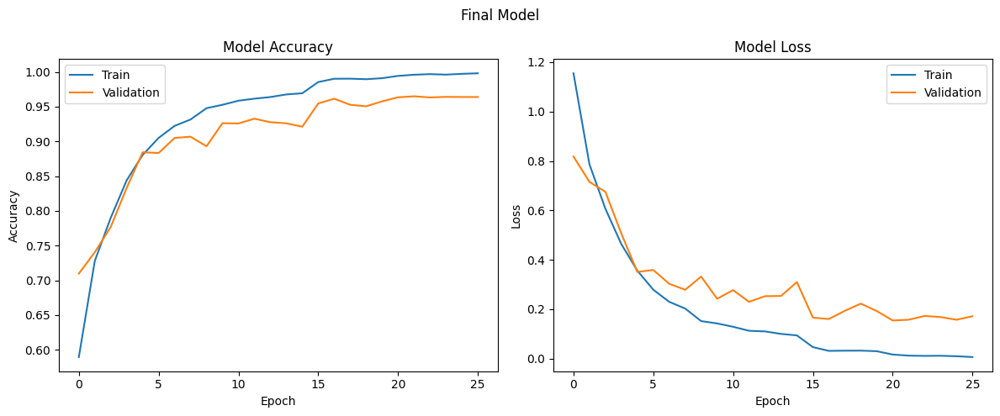

✓ Saved checkpoint: final_model


In [88]:


if not is_completed('final_model'):
    print("\n=== Training Final Model with Best Hyperparameters ===")
    
    # Collect best hyperparameters
    best_params = {
        'batch_size': best_batch_size,
        'num_layers': best_num_layers,
        'dropout_rate': best_dropout,
        'optimizer': best_optimizer,
        'weight_decay': best_weight_decay,
        'learning_rate': best_learning_rate,
        'use_scheduler': best_scheduler if 'best_scheduler' in locals() else True
    }
    
    print("Best hyperparameters:")
    for param, value in best_params.items():
        print(f"  {param}: {value}")
    
 
    clear_memory()

    final_model, final_history = train_model(
        X_train_final, y_train_split,
        X_val_final, y_val_split,
        batch_size=best_params['batch_size'],
        num_layers=best_params['num_layers'],
        dropout_rate=best_params['dropout_rate'],
        optimizer_name=best_params['optimizer'],
        weight_decay=best_params['weight_decay'],
        learning_rate=best_params['learning_rate'],
        use_scheduler=best_params['use_scheduler'],
        epochs=30,  # Train longer for final model
        model_name="final_model"
    )
    
   
    plot_history(final_history, "Final Model")
    
    # Save final model and history
    save_checkpoint(final_model, final_history, 'final_model')
    
    # Update progress
    progress['completed'].append('final_model')
    with open('/kaggle/working/progress.json', 'w') as f:
        json.dump(progress, f)
    
else:
    print("Loading final model from previous session...")
    final_model = tf.keras.models.load_model('/kaggle/working/models/final_model_model.keras')
    
    with open('/kaggle/working/results/final_model_history.pkl', 'rb') as f:
        final_history_data = pickle.load(f)
        final_history = type('', (), {})()
        final_history.history = final_history_data
    
    print("Final model loaded successfully")
    plot_history(final_history, "Final Model")

evulate model

show training samples

Evaluating model on validation data...

=== Model Evaluation ===
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9666 - loss: 0.1250
Validation accuracy: 0.9635
Validation loss: 0.1541
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

Classification Report:
              precision    recall  f1-score   support

   Badminton       0.96      0.97      0.97       836
     Cricket       0.97      0.96      0.96       934
      Karate       0.96      0.94      0.95       347
      Soccer       0.97      0.95      0.96       713
    Swimming       0.97      0.98      0.98       357
      Tennis       0.96      0.96      0.96       867
   Wrestling       0.96      0.98      0.97       883

    accuracy                           0.96      4937
   macro avg       0.96      0.96      0.96      4937
weighted avg       0.96      0.96      0.96      4937



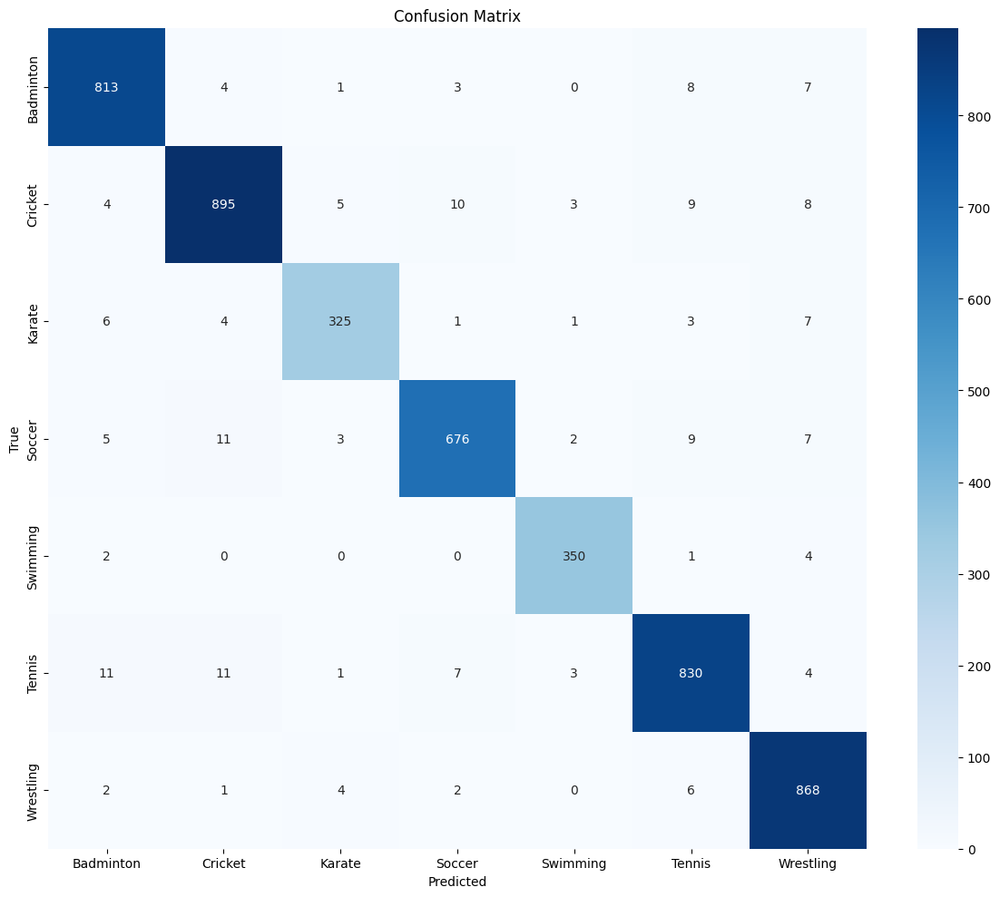

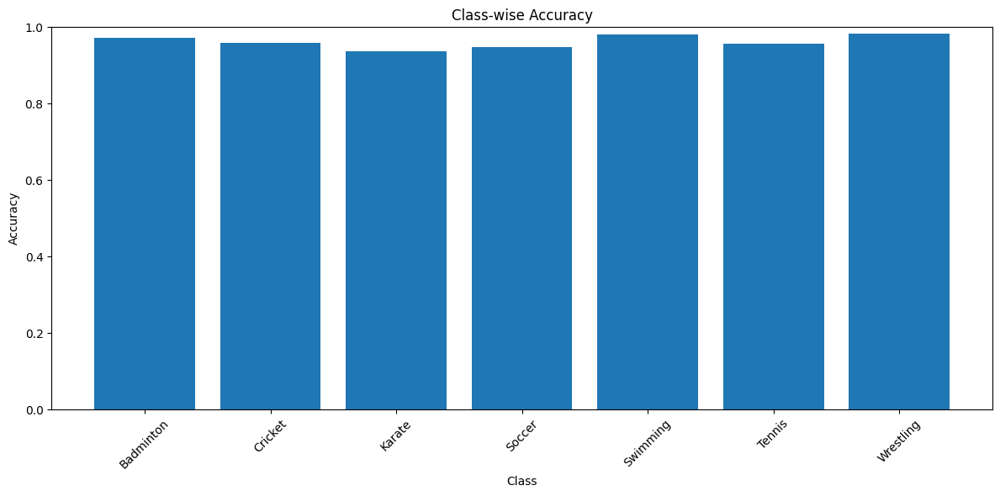

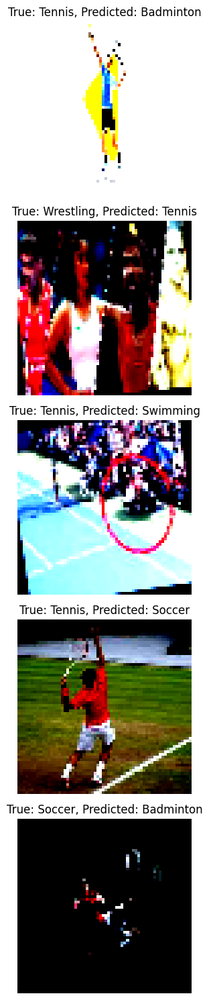

Validation accuracy: 0.9635


In [90]:

X_test = []
test_filenames = []

# Load test images
for _, row in test_df.head(100).iterrows():  
    img_path = os.path.join(TEST_DIR, row['image_ID'])
    try:
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            X_test.append(img)
            test_filenames.append(row['image_ID'])
    except Exception as e:
        print(f"Error loading test image {img_path}: {e}")

X_test = np.array(X_test)

# Preprocess test data
X_test_std = (X_test - train_mean) / train_std

# Call your existing evaluation function
print("Evaluating model on validation data...")
val_accuracy = evaluate_model(
    final_model, 
    X_val_std, 
    y_val_split,
    label_encoder.classes_
)

print(f"Validation accuracy: {val_accuracy:.4f}")

show grid of random test samples


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


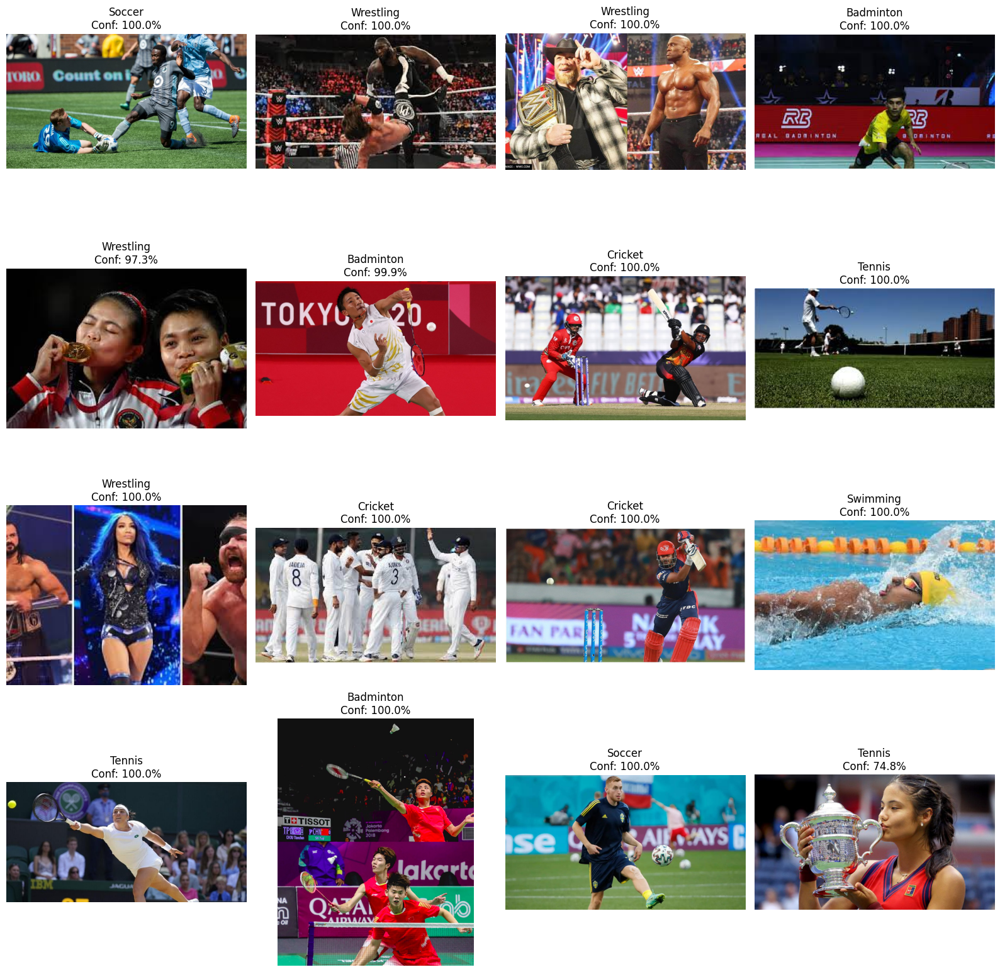

In [91]:

test_samples = test_df.sample(16)  # Get 16 random test images

# Create a grid to display them
plt.figure(figsize=(16, 16))
rows, cols = 4, 4

for i, (_, row) in enumerate(test_samples.iterrows()):
    # Load image
    img_path = os.path.join(TEST_DIR, row['image_ID'])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Resize for model
    img_resized = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    
    # Preprocess
    img_processed = (img_resized - train_mean) / train_std
    img_processed = np.expand_dims(img_processed, axis=0)  # Add batch dimension
    
    # Get prediction
    pred = final_model.predict(img_processed)[0]
    pred_class = np.argmax(pred)
    pred_label = label_encoder.classes_[pred_class]
    confidence = pred[pred_class] * 100
    
    # Display
    plt.subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.title(f"{pred_label}\nConf: {confidence:.1f}%")
    plt.axis('off')

plt.tight_layout()
plt.show()

saving for deployment

In [93]:


# Create directory for saving the model
import os
deployment_dir = '/kaggle/working/deployment'
os.makedirs(deployment_dir, exist_ok=True)

# Save the trained model
model_path = os.path.join(deployment_dir, 'sports_classifier_model.keras')
final_model.save(model_path)
print(f"Model saved to: {model_path}")

# Save preprocessing parameters (mean and std values)
import json
preprocessing_params = {
    'image_size': IMG_SIZE,
    'mean': train_mean.tolist(),
    'std': train_std.tolist(),
    'class_names': label_encoder.classes_.tolist()
}

params_path = os.path.join(deployment_dir, 'preprocessing_params.json')
with open(params_path, 'w') as f:
    json.dump(preprocessing_params, f)
print(f"Preprocessing parameters saved to: {params_path}")

print("\nModel and parameters successfully saved!")

Model saved to: /kaggle/working/deployment/sports_classifier_model.keras
Preprocessing parameters saved to: /kaggle/working/deployment/preprocessing_params.json

Model and parameters successfully saved!
